<a href="https://colab.research.google.com/github/hiyama341/ConStrain/blob/main/05_BUILD_croStrains_test_build.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pydna
!pip install pandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#!pip install xlrd == 1.2.0
!pip install --upgrade xlrd


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import IPython.core.display
import subprocess
import os
import pathlib
import itertools
import string
import numpy as np
import pandas as pd
import pydna
import Bio
import Bio.SeqRecord
import Bio.Seq
import Bio.SeqFeature
import Bio.SeqIO
import pydna.primer
import pydna.dseqrecord
import pydna.amplify
import pydna.assembly
import pydna.gel
import pydna.ladders
from Bio import SeqIO
from pydna.dseqrecord import Dseqrecord


In [ ]:
!git clone https://github.com/hiyama341/ConStrain_on_google_colab.git

fatal: destination path 'ConStrain_on_google_colab' already exists and is not an empty directory.


# Overview

- Genetic constructs

# Project

Debottlenecking the strictosidine module

Hypothesis
1. Specific combinations of CPR / G8H homologs and corresponding expression levels can remove the G8H bottleneck in the Strictosidine pathway

Aim: To test the hypothesis

Tasks
1. dgRNA
2. Base strain
3. **Library**
    - Homologs 9/10: different AA sequence
    - Expression 4/4
        - level: High low
        - timing: Early late (Compartmentalization)
     - Theoretical lib size: 1440
     - Characterization: ~ 250 Extracellular loganin
4. Phenotyping
5. Data analysis

# Library construction

#### This is the first library constructed to test the pooled constructions method. 

## Design

Below the Strictosidine pathway is shown from geraniol. 

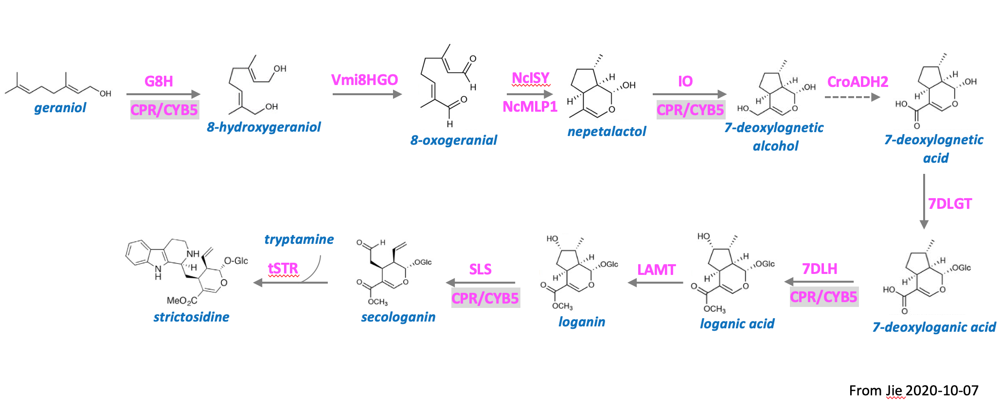

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/pictures/Pathway.png', width=800)

The core strain used in this study has the entire strictosidine module integrated except for the G8H and its concominat CPR. This background strain is called: MIA-HA-1. The module designed here will integrate the following: 10xCPR 4xpCPR 4x 9xG8H as shown schematically below. 

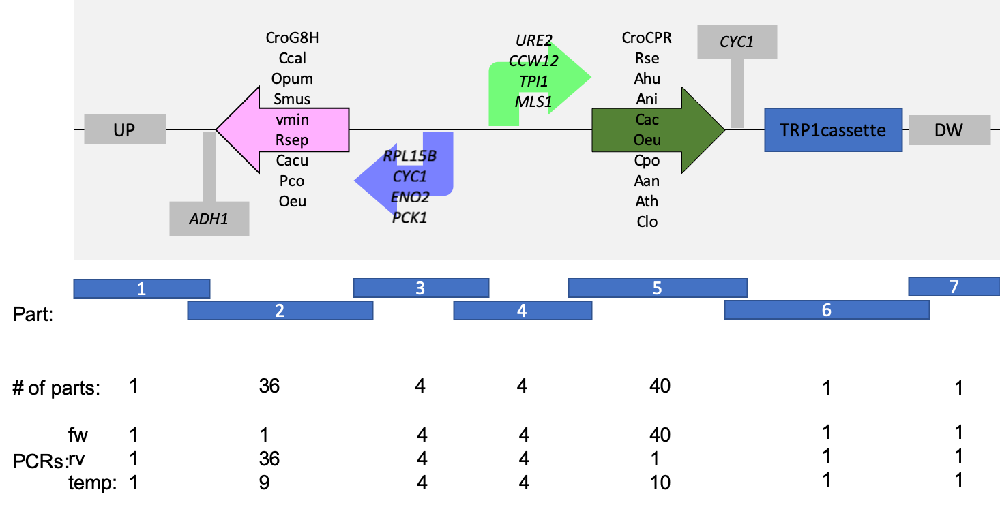

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/pictures/library_design_1.png', width=800)

Note on sequence homology: 
- As G8H and CPR parts have homology this library cannot be made in one transformation. Instead should be made in 9*10 individual transformation so as not to add two G8H or CPR homologs in one transformation mixtures.

- G8H PcoG8H is not available

## Background strain

We import the background strain MIA-HA-1

In [ ]:
from Bio import SeqIO
HA1 = record = SeqIO.read("/content/ConStrain_on_google_colab/Data/Strain_sequences/HA1.gb", "gb")
HA1.annotations['topology'] = "linear"

## gRNAs

The CRISPR plasmid that will facilitate the DB break: pESC-URA-gRNA_XI2-2

In [ ]:
pgRNA = SeqIO.read("/content/ConStrain_on_google_colab/Data/Plasmids/plasmid_test_.gbk", "gb")
pgRNA

SeqRecord(seq=Seq('GATCTGAAAACCTCTATTTTCAAGGTGGATCCTAACTCGCTCCTCAGGCTTCCT...TGA'), id='.', name='Exported', description='synthetic circular DNA', dbxrefs=[])

In [ ]:
pgRNA.name = "pESC-URA-gRNA_XI2-2"
pgRNA.annotations['batches'] = [{'location'    :'PL_12_I6',
                                 'volume'       : 40,
                                 'concentration': 250}]

In [ ]:
XI2_2_gRNA = pydna.dseqrecord.Dseqrecord("ACCCCCCTCAACTGATCAAC", name = "XI2-2_gRNA")

## Repair templates used here

# Names of the templates used: 

In [ ]:
G8H_template_names = ["pESC-CEN_RS-OeuG8H","PL_10_A1pMIA_JZ-40_CroG8H","PL_13_E5_(pRS416U-PcoG8H","pMIA_086_Rsep_G8O_in_p0057_(TRP)","pMIA_087_Vmin_G8O_in_p0057_(TRP)","pMIA_088_Opum_G8O_in_p0057_(TRP)","pMIA_089_Cacu_G8O_in_p0057_(TRP)","pMIA_090_Smus_G8O_in_p0057_(TRP)","pMIA_091_Ccal_G8O_in_p0057_(TRP)"]
pG8H_template_names = ['pCYC1','pENO2','pPCK1','pRPL15B']

CPR_template_names = ["CroCPR_tCYC1","AanCPR_tCYC1","AthATR1_tCYC1","CloCPR_tCYC1","RseCPR_tCYC1","AhuCPR_tCYC1","AniCPR_tCYC1","CacCPR_tCYC1","OeuCPR_tCYC1","CpoCPR_tCYC1"]
pCPR_template_names = ['pCCW12','pMLS1','pTPI1','pURE2']

marker_template_names = ["TRP1cassette"]

We can import the sequences with annotations from genbank files like such:

In [ ]:
from Bio import SeqIO
CPR_sites = []
G8H_sites = []
pCPR_sites= []
pG8H_sites= []

# GEtting the objects from the gb files

# CPR
for seq_record in SeqIO.parse('/content/ConStrain_on_google_colab/Data/G8H_CYP_CPR_PARTS/CPR_tCYC1_-_2022-06-06.gb', format= 'gb'):
    CPR_sites.append(seq_record)
    
# G8H
for seq_record in SeqIO.parse('/content/ConStrain_on_google_colab/Data/G8H_CYP_CPR_PARTS/G8H_tADH1_-_2022-06-06.gb', format= 'gb'):
    G8H_sites.append(seq_record)   

# pCPR
for seq_record in SeqIO.parse('/content/ConStrain_on_google_colab/Data/promoter_sequences/pCPR_sites.gb', format= 'gb'):
    pCPR_sites.append(seq_record)   
    
# pG8H
for seq_record in SeqIO.parse('/content/ConStrain_on_google_colab/Data/promoter_sequences/pG8H_sites.gb', format= 'gb'):
    pG8H_sites.append(seq_record)   


# UP; DW; MARKER
UP_DW_MARKER = []
for seq_record in SeqIO.parse('/content/ConStrain_on_google_colab/Data/G8H_CYP_CPR_PARTS/UP_DW_Marker.fasta', format= 'fasta'):
    UP_DW_MARKER.append(seq_record)

UP_sites, DW_sites, marker_sites = [UP_DW_MARKER[0]], [UP_DW_MARKER[1]], [UP_DW_MARKER[2]]


We can update template locations

Update locations

In [ ]:
p_temp_loc = 'l4_A01'

for temp in pG8H_sites:
    temp.annotations["batches"] = [{'location':p_temp_loc, 'volume':20,'concentration:': 120}]

for temp in pCPR_sites:
    temp.annotations["batches"] = [{'location':p_temp_loc, 'volume':20,'concentration:': 120}]
    
for temp in marker_sites:
    temp.annotations["batches"] = [{'location':'pL_01_E8', 'volume':100,'concentration:': 40}]

In [ ]:
for site in marker_sites:
    print(site.annotations['batches'])

[{'location': 'pL_01_E8', 'volume': 100, 'concentration:': 40}]


#### Template amplification sites

The following names can be used to retrieve the sequences we are interested in working with. 

In [ ]:
G8H_CDS_annotations = ["OeuG8O", "CroG8O", "Rsep_G8O_opt", "Vmin_G8O_opt", "Opum_G8O_opt", "Cacu_G8O_opt", "Smus_G8O_opt", "Ccal_G8O_opt"]

G8H_site_names = ["OeuG8H_tADH1", "CroG8H_tADH1", "RsepG8H_tADH", "Vmin_G8H_tADH1", "OpumG8H_tADH1", "CacuG8H_tADH1", "SmusG8_tADH1", "CcalG8_tADH1"]

pG8H_annotations = ['pCYC1','pENO2','pPCK1','pRPL15B']
pG8H_names = ['pCYC1','pENO2','pPCK1','pRPL15B']

pCPR_annotations = ['pCCW12','pMLS1','pTPI1','pURE2']
pCPR_names = ['pCCW12','pMLS1','pTPI1','pURE2']

CPR_CDS_annotations = ['Cro CPR', 'Aan CPR', 'ATR1 Arabidopsis CPR','CloCPR_opt2','RseCPR_opt2','AhuCPR_opt2','AniCPR_opt2','CacCPR_opt2','OeuCPR_opt2','CpoCPR_opt2']

CPR_site_names = ['CroCPR_tCYC1', 'AanCPR_tCYC1', 'AraCPR_tCYC1','CloCPR_tCYC1','RseCPR_tCYC1','AhuCPR_tCYC1','AniCPR_tCYC1','CacCPR_tCYC1','OeuCPR_tCYC1','CpoCPR_tCYC1']

marker_cassette_annotations = ["TRP1_marker"]
marker_cassette_names = ["cTRP1"]


Lets import some powerfull functions from ConStrain

In [ ]:
from ConStrain_on_google_colab.Script.cloning import extract_template_amplification_sites, extract_sites, multiplyList, removeTupleDuplicates, recs_no_duplicates, seq_to_annotation,plate_plot , casembler


In [ ]:
UP_sites[0].annotations['batches'] = [{'location':'l4_A01', 'volume':20,'concentration:': 120}]
DW_sites[0].annotations['batches'] = [{'location':'l4_A01', 'volume':20,'concentration': 120}]
UP_sites[0].name = 'XI-2_UP'
DW_sites[0].name = 'XI-2_DW'

**extract sites** the sites that we are itnerested in. 

In [ ]:
pG8H_sites = extract_sites(pG8H_annotations, pG8H_sites, pG8H_names)
pCPR_sites = extract_sites(pCPR_annotations, pCPR_sites, pCPR_names)
print(marker_sites)

[SeqRecord(seq=Seq('AGACGGTCACAGCTTGTCTGTAAGCGGATGCCGGGAGCAGACAAGCCCGTCAGG...ACG'), id='seq_3HMRtcpy', name='seq_3HMRtcpy', description='seq_3HMRtcpy <unknown description>', dbxrefs=[])]


We need to reverse complement the pG8H sites to work with them

In [ ]:
pG8H_sites = [site.reverse_complement(annotations=True,name=True) for site in pG8H_sites]
pG8H_sites

[SeqRecord(seq=Seq('TATTAATTTAGTGTGTGTATTTGTGTTTGTGTGTCTATAGAAGTATAGTAATTT...CTG'), id='<unknown id>', name='pCYC1', description='<unknown description>', dbxrefs=[]),
 SeqRecord(seq=Seq('TATTATTGTATGTTATAGTATTAGTTGCTTGGTGTTATGAAAGAAACTAAGAAA...ATT'), id='<unknown id>', name='pENO2', description='<unknown description>', dbxrefs=[]),
 SeqRecord(seq=Seq('GTTGTTATTTTATTATGGAATAATTAGTTGCGTGAGTTTGGTTTTTTTTTTTAT...GTG'), id='<unknown id>', name='pPCK1', description='<unknown description>', dbxrefs=[]),
 SeqRecord(seq=Seq('TGCTTGTGTGGTAGGTAATTTGTGACTGTCTTTACGGTAGCTTTCGCCGATTAC...TAC'), id='<unknown id>', name='pRPL15B', description='<unknown description>', dbxrefs=[])]

#### Determine primer sequences

We have 7 fragments in a list and the following shows all the possible combinations, how many times each fragment is repeated. 

Additionally we can make a matrix with all combinations for 

From:  fragment list (7) containing parts lists (1,9,4,4,10,1,1 or variable) 

To  :  combinations list 7 fragments * x combinations (1440 or variable; matrix)

In [ ]:
#Create a list of fragments within a list of parts.
fragment_list = [UP_sites,G8H_sites,pG8H_sites,pCPR_sites,CPR_sites,marker_sites,DW_sites]

#The number of fragments to be assembled
no_frags = len(fragment_list)
print("Number of fragments:", no_frags)

#The number of parts of each fragment
no_parts = [len(l) for l in fragment_list]
print("Number of parts: ",no_parts)

#The number of possible combinations
no_combs = multiplyList(no_parts)
print("Number of possible combinations:",no_combs)

#How many repitions are needed?
repetition_list = [int(no_comb/no_part) for no_comb, no_part in zip([no_combs]*len(no_parts),no_parts)]
print("The number of time each fragment must be repeated:", repetition_list)

#Matrix with all combinations
print("\nCombinations:")
combinations_matrix = [t for t in itertools.product(*fragment_list)]
for row in combinations_matrix:
    names = []
    for element in row:
        names.append(element.name)
    print(names)

Number of fragments: 7
Number of parts:  [1, 9, 4, 4, 10, 1, 1]
Number of possible combinations: 1440
The number of time each fragment must be repeated: [1440, 160, 360, 360, 144, 1440, 1440]

Combinations:
['XI-2_UP', 'CcalG8H_tADH1', 'pCYC1', 'pCCW12', 'AhuCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'CcalG8H_tADH1', 'pCYC1', 'pCCW12', 'AanCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'CcalG8H_tADH1', 'pCYC1', 'pCCW12', 'CloCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'CcalG8H_tADH1', 'pCYC1', 'pCCW12', 'CacCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'CcalG8H_tADH1', 'pCYC1', 'pCCW12', 'AniCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'CcalG8H_tADH1', 'pCYC1', 'pCCW12', 'CpoCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'CcalG8H_tADH1', 'pCYC1', 'pCCW12', 'OeuCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'CcalG8H_tADH1', 'pCYC1', 'pCCW12', 'RseCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'CcalG8H_tADH1', 'pCYC1', 'pCCW12', 'AthATR1_tCYC1', 

Upload strains to benchling. Create spreadsheets for
1. Benchling 
    1. add strain entities
    2. add sequence as plasmid entities

Add strain entities

In the following,  a matrix with primers fw, rv primer pair for each part is made to match the matrix above. 

From: combinations matrix

To  : primers matrix of tuples (fw,rv)

In [ ]:
lea_primers = pd.read_excel("/content/ConStrain_on_google_colab/Data/Teselagen/G8H_CPR_library.xls", sheet_name = "all primers").reset_index(drop=True)
lea_primers

,Id,Name,Target Parts,Size,Cost,Tm,Tm (3' only),Sequence (3' only),Sequence,Location
0,3460,PR_UP_tADH1_05,XI-2_UP,22,2.2,58.178,58.178,GAGGATTTTCGATGGAGC,GAGGATTTTCGATGGAGC,o2_I06
1,3461,PR_UP_tADH1_06,XI-2_UP,64,6.4,69.335,57.264,TTGTGGAAGTTCATGGC,TAGGTCAGGTTGCTTTCTCAGGTATAGCATGAGGTCGCTCTTGTGG...,o2_I07
2,3407,PR_G8H_01,"VminG8H_tADH1,SmusG8H_tADH1,RsepG8H_tADH1,Cacu...",19,1.9,57.335,57.335,GAGCGACCTCATGCTATAC,GAGCGACCTCATGCTATAC,op4_A10
3,3408,PR_G8H_02,"VminG8H_tADH1,TIS_AAAACA",62,6.2,63.653,57.979,ATGGATTACTTGACGATCGC,AGACACACAAACACAAATACACACACTAAATTAATAAAAACAATGG...,op4_A01
4,3409,PR_G8H_03,"VminG8H_tADH1,TIS_AAAACA",61,6.1,64.693,57.979,ATGGATTACTTGACGATCGC,ACACCAAGCAACTAATACTATAACATACAATAATAAAAACAATGGA...,op4_B01
...,...,...,...,...,...,...,...,...,...,...
91,3370,PR_CPR_02,"CroCPR_tCYC1,RseCPR_tCYC1,OeuCPR_tCYC1,CpoCPR_...",20,2.0,56.289,56.289,TTCTCAAGCAAGGTTTTCAG,TTCTCAAGCAAGGTTTTCAG,op4_B10
92,3468,PR_TRP1-DW_01,TRP1-marker,61,6.1,72.322,66.788,AGACGGTCACAGCTTGTCTGTAAGC,CGCATGTAACATTATACTGAAAACCTTGCTTGAGAAAGACGGTCAC...,op4_C10
93,3469,PR_TRP1-DW_02,TRP1-marker,18,1.8,65.423,65.423,CGTAGTGGGCCATCGCCC,CGTAGTGGGCCATCGCCC,op4_D10
94,3470,PR_TRP1-DW_05,XI-2_DW,63,6.3,66.938,58.341,CACACGACTAGCGCT,GCGAAAAACCGTCTATCAGGGCGATGGCCCACTACGCACACGACTA...,o2_I08


In [ ]:
lea_parts = pd.read_excel("/content/ConStrain_on_google_colab/Data/Teselagen/G8H_CPR_library.xls", sheet_name = "all parts").reset_index(drop=True)
lea_parts

,Overlaps_to,order,Part,Promoter,Id,Name,Note,Forward Oligo Id,Forward Oligo Name,Reverse Oligo Id,...,Q5_ta,Length,Sequence,Location,Template_location,Template_name,Box_barcode,volume,concentration,Column1
0,pCYC1,1,NaN,NaN,2339,PCR_G8H_01,PCR,3407,PR_G8H_01,3408,...,63,1845,GAGCGACCTCATGCTATACCTGAGAAAGCAACCTGACCTACAGGAA...,l5_A03,NaN,pMIA_087_Vmin_G8O_in_p0057_(TRP),81BOX762,100.0,40.0,NaN
1,pENO2,2,NaN,NaN,2340,PCR_G8H_02,PCR,3407,PR_G8H_01,3409,...,63,1844,GAGCGACCTCATGCTATACCTGAGAAAGCAACCTGACCTACAGGAA...,l5_A04,NaN,pMIA_087_Vmin_G8O_in_p0057_(TRP),81BOX762,100.0,45.0,NaN
2,pPCK1,3,NaN,NaN,2341,PCR_G8H_03,PCR,3407,PR_G8H_01,3410,...,63,1841,GAGCGACCTCATGCTATACCTGAGAAAGCAACCTGACCTACAGGAA...,l5_A05,NaN,pMIA_087_Vmin_G8O_in_p0057_(TRP),81BOX762,100.0,40.0,NaN
3,pRPL15B,4,NaN,NaN,2342,PCR_G8H_04,PCR,3407,PR_G8H_01,3411,...,63,1839,GAGCGACCTCATGCTATACCTGAGAAAGCAACCTGACCTACAGGAA...,l5_A06,NaN,pMIA_087_Vmin_G8O_in_p0057_(TRP),81BOX762,100.0,45.0,NaN
4,pCYC1,5,NaN,NaN,2343,PCR_G8H_05,PCR,3407,PR_G8H_01,3412,...,63,1851,GAGCGACCTCATGCTATACCTGAGAAAGCAACCTGACCTACAGGAA...,l5_A07,NaN,pMIA_090_Smus_G8O_in_p0057_(TRP),81BOX762,100.0,40.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82,pMLS1,83,NaN,NaN,2323,PCR_CPR_25,PCR,3393,PR_CPR_25,3370,...,60,2264,CAAAGTAGTAAAAGCACATAAAAGAATTAAGAAATAAAACAATGGA...,l5_I05,NaN,PL_13_F3_(pRS415U-P2_TEF1-CpoCPR_opt2),81BOX762,100.0,35.0,NaN
83,pCCW12,84,NaN,NaN,2333,PCR_CPR_35,PCR,3402,PR_CPR_34,3370,...,60,2259,CTGTCATTCGCTTAAACACTATATCAATATAAAACAATGGATGAAA...,l5_I06,NaN,PL_13_F3_(pRS415U-P2_TEF1-CpoCPR_opt2),81BOX762,100.0,30.0,NaN
84,none,85,XI-2_UP,NaN,2383,PCR_UP_tADH1_01,PCR,3460,PR_UP_tADH1_05,3461,...,60,609,GAGGATTTTCGATGGAGCAGGATGAGGAGAAATAGTACCACATGTA...,l5_I08,NaN,DNA extract degron library,81BOX762,100.0,30.0,NaN
85,none,86,TRP1-marker,NaN,2387,PCR_TRP1-DW_01,PCR,3468,PR_TRP1-DW_01,3469,...,72,1451,CGCATGTAACATTATACTGAAAACCTTGCTTGAGAAAGACGGTCAC...,l5_I07,NaN,pL_01_E8_(pRS414-USER-ccdB),81BOX762,100.0,155.0,NaN


In [ ]:
# Making an empty matrix where that the primers can be appended to
primer_matrix = [[] for i in range(no_combs)]
len(primer_matrix)

1440

In [ ]:
#Initialize matrix
primer_matrix = [[] for i in range(no_combs)]
for comb_no in range(0, no_combs):
    for frag_no in range(0, no_frags):
        comb_seq = str(combinations_matrix[comb_no][frag_no].seq.upper())

        #G8H
        if frag_no == 1:
            #index used for getting the names from overlapping parts
            idx = frag_no + 1
        # CPR
        elif frag_no == 4:
            idx = frag_no - 1
        else:
            idx  = frag_no
        
        if idx != frag_no:
            name = combinations_matrix[comb_no][idx].name
            true_false = np.logical_and(lea_parts['Sequence'].str.contains(comb_seq), lea_parts['Overlaps_to'] == name)
        else:
            true_false = lea_parts['Sequence'].str.contains(comb_seq)
        
        #print(true_false.value_counts())

        comb_seq_idx = lea_parts[true_false].index
        #print(comb_seq_idx)

        forward_primer_name = lea_parts.loc[comb_seq_idx,['Forward Oligo Name']].values[0][0]
        reverse_primer_name = lea_parts.loc[comb_seq_idx,['Reverse Oligo Name']].values[0][0]
        
        forward_primer_idx  = lea_primers[lea_primers['Name'] == forward_primer_name].index
        forward_seq         = lea_primers.loc[forward_primer_idx,['Sequence']].values[0][0]
        forward_loc         = lea_primers.loc[forward_primer_idx,['Location']].values[0][0]
        forward_primer      = pydna.primer.Primer(pydna.dseqrecord.Dseqrecord(forward_seq, id = forward_primer_name))
        #forward_primer.annotations['location'] = forward_loc
        forward_primer.annotations['batches'] = []
        forward_primer.annotations['batches'].append({'location'      : forward_loc,
                                                      'volume'        : 100,
                                                      'concentration' : 10})
        reverse_primer_idx  = lea_primers[lea_primers['Name'] == reverse_primer_name].index
        reverse_seq         = lea_primers.loc[reverse_primer_idx,['Sequence']].values[0][0]
        reverse_loc         = lea_primers.loc[reverse_primer_idx,['Location']].values[0][0]
        reverse_primer      = pydna.primer.Primer(pydna.dseqrecord.Dseqrecord(reverse_seq, id = reverse_primer_name))
        #reverse_primer.annotations['location'] = reverse_loc
        reverse_primer.annotations['batches'] = []
        reverse_primer.annotations['batches'].append({'location'      : reverse_loc,
                                                      'volume'        : 100,
                                                      'concentration' : 10})
        
        primer_matrix[comb_no].append((forward_primer, reverse_primer))
        


Validate primer matrix by printing

In [ ]:
primer_matrix_reshaped = [list(x) for x in zip(*primer_matrix)]
primer_matrix_reshaped

[[(PR_UP_tADH1_05 18-mer:5'-GAGGATTTTCGATGGAGC-3',
   PR_UP_tADH1_06 57-mer:5'-TAGGTCAGGTTGCTT..GGC-3'),
  (PR_UP_tADH1_05 18-mer:5'-GAGGATTTTCGATGGAGC-3',
   PR_UP_tADH1_06 57-mer:5'-TAGGTCAGGTTGCTT..GGC-3'),
  (PR_UP_tADH1_05 18-mer:5'-GAGGATTTTCGATGGAGC-3',
   PR_UP_tADH1_06 57-mer:5'-TAGGTCAGGTTGCTT..GGC-3'),
  (PR_UP_tADH1_05 18-mer:5'-GAGGATTTTCGATGGAGC-3',
   PR_UP_tADH1_06 57-mer:5'-TAGGTCAGGTTGCTT..GGC-3'),
  (PR_UP_tADH1_05 18-mer:5'-GAGGATTTTCGATGGAGC-3',
   PR_UP_tADH1_06 57-mer:5'-TAGGTCAGGTTGCTT..GGC-3'),
  (PR_UP_tADH1_05 18-mer:5'-GAGGATTTTCGATGGAGC-3',
   PR_UP_tADH1_06 57-mer:5'-TAGGTCAGGTTGCTT..GGC-3'),
  (PR_UP_tADH1_05 18-mer:5'-GAGGATTTTCGATGGAGC-3',
   PR_UP_tADH1_06 57-mer:5'-TAGGTCAGGTTGCTT..GGC-3'),
  (PR_UP_tADH1_05 18-mer:5'-GAGGATTTTCGATGGAGC-3',
   PR_UP_tADH1_06 57-mer:5'-TAGGTCAGGTTGCTT..GGC-3'),
  (PR_UP_tADH1_05 18-mer:5'-GAGGATTTTCGATGGAGC-3',
   PR_UP_tADH1_06 57-mer:5'-TAGGTCAGGTTGCTT..GGC-3'),
  (PR_UP_tADH1_05 18-mer:5'-GAGGATTTTCGATGGAGC-3',
   P

In [ ]:
for frag_no, frag in enumerate(primer_matrix_reshaped):
    print("All primer pairs for fragment no: " + str(frag_no+1))

All primer pairs for fragment no: 1
All primer pairs for fragment no: 2
All primer pairs for fragment no: 3
All primer pairs for fragment no: 4
All primer pairs for fragment no: 5
All primer pairs for fragment no: 6
All primer pairs for fragment no: 7


Validate primer matrix by printing only different primers

In [ ]:
primer_matrix_reshaped_no_duplicates = [removeTupleDuplicates(lst) for lst in primer_matrix_reshaped]

In [ ]:
len(primer_matrix_reshaped_no_duplicates[1])

36

In [ ]:
for frag_no, frag in enumerate(primer_matrix_reshaped_no_duplicates):
    print("All primer pairs for fragment no: " + str(frag_no))


All primer pairs for fragment no: 0
All primer pairs for fragment no: 1
All primer pairs for fragment no: 2
All primer pairs for fragment no: 3
All primer pairs for fragment no: 4
All primer pairs for fragment no: 5
All primer pairs for fragment no: 6


Comments.
- All primer pairs for CPR contains 36 and not 40 pairs. This is because the four primers for RseCPR, CloCPR have the same sequence and the 4 and can be reused.
- Missing PR_CPR_05. Copy of PR_CPR_02 with additional t. Designed by mistake due to additional tCYC1 bp in template

In [ ]:
lists_of_primers = []
# For each frag lst
for frag_no in range(0, no_frags):
    #From: list of tuples 
    #To  : list
    primers_tp = primer_matrix_reshaped_no_duplicates[frag_no]
    primers = [item for t in primers_tp for item in t]
    
    # From: list of primer
    # To: list of primers without sequence duplicates
    primers_no_dup = recs_no_duplicates(primers)
    
    lists_of_primers.append(primers_no_dup)

In [ ]:
primers = [item for sublist in lists_of_primers for item in sublist]
len(primers)

96

In [ ]:
for primer in primers:
    print(primer.id, "\t", primer.annotations['batches'][0]['location'])

PR_UP_tADH1_05 	 o2_I06
PR_UP_tADH1_06 	 o2_I07
PR_G8H_01 	 op4_A10
PR_G8H_06 	 op4_A02
PR_G8H_28 	 op4_C07
PR_G8H_31 	 op4_B08
PR_G8H_26 	 op4_A07
PR_G8H_03 	 op4_B01
PR_G8H_22 	 op4_A06
PR_G8H_35 	 op4_B09
PR_G8H_20 	 op4_C05
PR_G8H_19 	 op4_B05
PR_G8H_18 	 op4_A05
PR_G8H_02 	 op4_A01
PR_G8H_05 	 op4_D01
PR_G8H_13 	 op4_D03
PR_G8H_32 	 op4_C08
PR_G8H_27 	 op4_B07
PR_G8H_08 	 op4_C02
PR_G8H_34 	 op4_A09
PR_G8H_17 	 op4_D04
PR_G8H_21 	 op4_D05
PR_G8H_33 	 op4_D08
PR_G8H_14 	 op4_A04
PR_G8H_16 	 op4_C04
PR_G8H_29 	 op4_D07
PR_G8H_37 	 op4_D09
PR_G8H_11 	 op4_B03
PR_G8H_15 	 op4_B04
PR_G8H_10 	 op4_A03
PR_G8H_23 	 op4_B06
PR_G8H_25 	 op4_D06
PR_G8H_04 	 op4_C01
PR_G8H_07 	 op4_B02
PR_G8H_36 	 op4_C09
PR_G8H_24 	 op4_C06
PR_G8H_09 	 op4_D02
PR_G8H_12 	 op4_C03
PR_G8H_30 	 op4_A08
PR_PRO_13 	 op4_G11
PR_PRO_14 	 op4_G12
PR_PRO_15 	 op4_H11
PR_PRO_16 	 op4_H12
PR_PRO_01 	 op4_A11
PR_PRO_02 	 op4_A12
PR_PRO_11 	 op4_F11
PR_PRO_12 	 op4_F12
PR_PRO_05 	 op4_C11
PR_PRO_06 	 op4_C12
PR_PRO_09 	 

### Primers (order)
- add primers to storage digitally
- receive primers, dissolve to 10 μM, note volume
- add primers to storage physical

### PCRs

- Simulate amplicons
- Add amplicons to to storage digitally
- Create pcrs, purify, estimate concentration and volume
- Add pcrs concentration and volume to storage digitally (Benchling batch information)
- Add pcrs to storage physical
- Retrieve pcrs concentration and volume from Benchling
- Restructure amplicons matrix to list of amplicons and amplicons

#### Simulate amplicons

In [ ]:
combinations_matrix[0][0].name

'XI-2_UP'

In [ ]:
#Initizalise
amplicon_matrix = [[] for i in range(no_combs)]

for comb_no in range(0, no_combs):
    for frag_no in range(0, no_frags):
        template       = pydna.dseqrecord.Dseqrecord(combinations_matrix[comb_no][frag_no])

        forward_primer = primer_matrix[comb_no][frag_no][0]
        reverse_primer = primer_matrix[comb_no][frag_no][1]
        
        amplicon = pydna.amplify.pcr(forward_primer, reverse_primer,  template)
        
        amplicon.annotations['template_name'] = template.name
        #print(amplicon.annotations, template.annotations)
        #amplicon.annotations['template_location'] = template.annotations['batches'][0]['location']
        
        comb_seq = amplicon.seq.watson.upper()
        true_false = lea_parts['Sequence'].str.contains(comb_seq)
        comb_seq_idx = lea_parts[true_false].index
        
        amplicon_name  = lea_parts.loc[comb_seq_idx,['Name']].values[0][0]
        amplicon.name = amplicon_name
        
        amplicon_loc  = lea_parts.loc[comb_seq_idx,['Location']].values[0][0]
        amplicon_vol  = lea_parts.loc[comb_seq_idx,['volume']].values[0][0]
        amplicon_con  = lea_parts.loc[comb_seq_idx,['concentration']].values[0][0]
        amplicon.annotations['batches'] = []
        amplicon.annotations['batches'].append(  {'location'      : amplicon_loc,
                                                  'volume'        : amplicon_vol,
                                                  'concentration' : amplicon_con})
        
        amplicon.forward_primer.annotations['tm Q5 Hot Start'] = lea_parts.loc[comb_seq_idx,['Q5_fw_tm']].values[0][0]
        amplicon.reverse_primer.annotations['tm Q5 Hot Start'] = lea_parts.loc[comb_seq_idx,['Q5_rv_tm']].values[0][0]
        amplicon.annotations['ta Q5 Hot Start'] = lea_parts.loc[comb_seq_idx,['Q5_ta']].values[0][0]
        
        ## Remove additional wrong primer annotation added by pydna.amplify.pcr
        amplicon.features = [feat for feat in amplicon.features if feat.type != "primer_bind"]
        
        seq_to_annotation(amplicon, amplicon, "PCR_product")
        seq_to_annotation(forward_primer, amplicon, "primer_bind")
        seq_to_annotation(reverse_primer, amplicon, "primer_bind")
        
        amplicon_matrix[comb_no].append(amplicon)



In [ ]:
amplicon_matrix[0][6].annotations['batches']

[{'concentration': 40.0, 'location': 'l5_I09', 'volume': 100.0}]

In [ ]:
for amp in amplicon_matrix[0]:
    print(amp.name)
    print(amp.annotations['batches'])
    print()

PCR_UP_tADH1_01
[{'location': 'l5_I08', 'volume': 100.0, 'concentration': 30.0}]

PCR_G8H_33
[{'location': 'l5_D08', 'volume': 100.0, 'concentration': 50.0}]

PCR_PRO_01
[{'location': 'l4_C07', 'volume': 100.0, 'concentration': 100.0}]

PCR_PRO_02
[{'location': 'l4_C08', 'volume': 100.0, 'concentration': 100.0}]

PCR_CPR_36
[{'location': 'l5_G08', 'volume': 100.0, 'concentration': 20.0}]

PCR_TRP1-DW_01
[{'location': 'l5_I07', 'volume': 100.0, 'concentration': 155.0}]

PCR_TRP1-DW_02
[{'location': 'l5_I09', 'volume': 100.0, 'concentration': 40.0}]



Validate amplicon matrix by printing

In [ ]:
amplicon_matrix_reshaped = [list(x) for x in zip(*amplicon_matrix)]

Validate amplicon matrix by printing only different ampllicons

In [ ]:
amplicon_matrix_reshaped_no_duplicates = [recs_no_duplicates(lst) for lst in amplicon_matrix_reshaped]

In [ ]:
for frag_list_no, frag_list in enumerate(amplicon_matrix_reshaped_no_duplicates):
    print("All parts for fragment no: " + str(frag_list_no))
    for frag in frag_list:
        print(frag.name)
    print()

All parts for fragment no: 0
PCR_UP_tADH1_01

All parts for fragment no: 1
PCR_G8H_33
PCR_G8H_34
PCR_G8H_35
PCR_G8H_36
PCR_G8H_25
PCR_G8H_26
PCR_G8H_27
PCR_G8H_28
PCR_G8H_21
PCR_G8H_22
PCR_G8H_23
PCR_G8H_24
PCR_G8H_17
PCR_G8H_18
PCR_G8H_19
PCR_G8H_20
PCR_G8H_13
PCR_G8H_14
PCR_G8H_15
PCR_G8H_16
PCR_G8H_09
PCR_G8H_10
PCR_G8H_11
PCR_G8H_12
PCR_G8H_05
PCR_G8H_06
PCR_G8H_07
PCR_G8H_08
PCR_G8H_01
PCR_G8H_02
PCR_G8H_03
PCR_G8H_04
PCR_G8H_29
PCR_G8H_30
PCR_G8H_31
PCR_G8H_32

All parts for fragment no: 2
PCR_PRO_01
PCR_PRO_06
PCR_PRO_07
PCR_PRO_08

All parts for fragment no: 3
PCR_PRO_02
PCR_PRO_03
PCR_PRO_04
PCR_PRO_05

All parts for fragment no: 4
PCR_CPR_36
PCR_CPR_40
PCR_CPR_39
PCR_CPR_38
PCR_CPR_37
PCR_CPR_35
PCR_CPR_34
PCR_CPR_32
PCR_CPR_33
PCR_CPR_31
PCR_CPR_26
PCR_CPR_30
PCR_CPR_29
PCR_CPR_28
PCR_CPR_27
PCR_CPR_25
PCR_CPR_24
PCR_CPR_22
PCR_CPR_23
PCR_CPR_21
PCR_CPR_16
PCR_CPR_20
PCR_CPR_19
PCR_CPR_18
PCR_CPR_17
PCR_CPR_15
PCR_CPR_14
PCR_CPR_12
PCR_CPR_13
PCR_CPR_11
PCR_CPR_06
PCR_CPR_10

Print list of amplicons

In [ ]:
amplicons = [item for sublist in amplicon_matrix_reshaped_no_duplicates for item in sublist]
len(amplicons)

87

In [ ]:
amplicons[0].template.annotations

{'batches': [{'concentration:': 120, 'location': 'l4_A01', 'volume': 20}],
 'molecule_type': 'DNA'}

In [ ]:
for amplicon in amplicons:
    print(amplicon.name, "\t", amplicon.annotations['batches'][0]['location'])

PCR_UP_tADH1_01 	 l5_I08
PCR_G8H_33 	 l5_D08
PCR_G8H_34 	 l5_D09
PCR_G8H_35 	 l5_E01
PCR_G8H_36 	 l5_E02
PCR_G8H_25 	 l5_C09
PCR_G8H_26 	 l5_D01
PCR_G8H_27 	 l5_D02
PCR_G8H_28 	 l5_D03
PCR_G8H_21 	 l5_C05
PCR_G8H_22 	 l5_C06
PCR_G8H_23 	 l5_C07
PCR_G8H_24 	 l5_C08
PCR_G8H_17 	 l5_C01
PCR_G8H_18 	 l5_C02
PCR_G8H_19 	 l5_C03
PCR_G8H_20 	 l5_C04
PCR_G8H_13 	 l5_B06
PCR_G8H_14 	 l5_B07
PCR_G8H_15 	 l5_B08
PCR_G8H_16 	 l5_B09
PCR_G8H_09 	 l5_B02
PCR_G8H_10 	 l5_B03
PCR_G8H_11 	 l5_B04
PCR_G8H_12 	 l5_B05
PCR_G8H_05 	 l5_A07
PCR_G8H_06 	 l5_A08
PCR_G8H_07 	 l5_A09
PCR_G8H_08 	 l5_B01
PCR_G8H_01 	 l5_A03
PCR_G8H_02 	 l5_A04
PCR_G8H_03 	 l5_A05
PCR_G8H_04 	 l5_A06
PCR_G8H_29 	 l5_D04
PCR_G8H_30 	 l5_D05
PCR_G8H_31 	 l5_D06
PCR_G8H_32 	 l5_D07
PCR_PRO_01 	 l4_C07
PCR_PRO_06 	 l4_D03
PCR_PRO_07 	 l4_D04
PCR_PRO_08 	 l4_D05
PCR_PRO_02 	 l4_C08
PCR_PRO_03 	 l4_C09
PCR_PRO_04 	 l4_D01
PCR_PRO_05 	 l4_D02
PCR_CPR_36 	 l5_G08
PCR_CPR_40 	 l5_F01
PCR_CPR_39 	 l5_F09
PCR_CPR_38 	 l5_H07
PCR_CPR_37 	 l5

In [ ]:
from ConStrain_on_google_colab.Script.PCR import det_proc_speed, det_elon_time, pcr_locations, pcr_volumes, det_no_of_thermal_cyclers


In [ ]:
pol = 'Q5 Hot Start'
for amplicon in amplicons:
    amplicon.annotations['polymerase'] = pol
    amplicon = det_proc_speed(amplicon)
    amplicon = det_elon_time(amplicon)

#### Add amplicons to storage digitally
- to_benchling...

#### Create physical pcrs, purify, estimate concentration and volume

PCR
- Polymerase: Q5 2x MasterMix [protocol](https://international.neb.com/protocols/2012/08/30/protocol-for-q5-hot-start-high-fidelity-2x-master-mix-m0494)
- Program: Create according to protocol
- Elongation time: 1.5 min (30 s/ kb)
- Annealing temp 58
    - All primers are designed to have 3' Tm 59C-54C, and Ta 59C-62C when using  Q5 2x MasterMix (calculated with NEB Tm calculator)

In [ ]:
longest_amplicon = 0
for parts in amplicon_matrix_reshaped_no_duplicates:
    for amp in parts:
        if len(amp) > longest_amplicon: longest_amplicon = len(amp)
print("Length of longest amplicon: \t" + str(longest_amplicon) + " bp")
print("Elongation time: \t\t"  + str(round(longest_amplicon/1000 * 35,1))+ " seconds")

Length of longest amplicon: 	2369 bp
Elongation time: 		82.9 seconds


In [ ]:
for a in amplicon_matrix_reshaped_no_duplicates[4]:
    print(a.name, len(a))

PCR_CPR_36 2364
PCR_CPR_40 2334
PCR_CPR_39 2364
PCR_CPR_38 2346
PCR_CPR_37 2304
PCR_CPR_35 2259
PCR_CPR_34 2346
PCR_CPR_32 2364
PCR_CPR_33 2298
PCR_CPR_31 2364
PCR_CPR_26 2369
PCR_CPR_30 2339
PCR_CPR_29 2369
PCR_CPR_28 2351
PCR_CPR_27 2309
PCR_CPR_25 2264
PCR_CPR_24 2351
PCR_CPR_22 2369
PCR_CPR_23 2303
PCR_CPR_21 2369
PCR_CPR_16 2364
PCR_CPR_20 2334
PCR_CPR_19 2364
PCR_CPR_18 2346
PCR_CPR_17 2304
PCR_CPR_15 2259
PCR_CPR_14 2346
PCR_CPR_12 2364
PCR_CPR_13 2298
PCR_CPR_11 2364
PCR_CPR_06 2365
PCR_CPR_10 2335
PCR_CPR_09 2365
PCR_CPR_08 2347
PCR_CPR_07 2305
PCR_CPR_05 2260
PCR_CPR_04 2347
PCR_CPR_02 2365
PCR_CPR_03 2299
PCR_CPR_01 2365


Lane no. 2 has bands ~1400bp. This is PcoG8H that are shorter than other G8H
Investigate via:
- amplicon_matrix_reshaped_no_duplicates
- amplicon_matrix_reshaped_no_duplicates[1][9].name
- amplicon_matrix_reshaped_no_duplicates[1][9].name
- amplicon_matrix_reshaped_no_duplicates[1][9].annotations['template_name']

Design PCR plate:

- Locations and amounts (each well ~20x 50 µl PCR reactions):
    - amplicons
    - templates          >= 20 µl, 10-20 ng/ul
    - fw_primers         >= 75 µl, 10 µM total
    - rv_primers         >= 75 µl, 10 µM total
    - fw_and_rv_primers  >= 100 µl, 10 µM total (5 µM each)

Comments:
- Check whether templates p1_H01 and p1_H03 are missing
- Add plates to benchling, get ID and add ID to plates in freezer
- Check and create Q5 hot start MM PCR program

In [ ]:
plate_locations = []
for amplicon in amplicons:
    plate_locations.append([amplicon.name, 
                            amplicon.annotations['batches'][0]['location'],
                            amplicon.annotations['template_name'],
                            
                            #amplicon.template.annotations['batches'][0]['location'],
                            amplicon.forward_primer.id,
                            amplicon.forward_primer.annotations['batches'][0]['location'],
                            amplicon.reverse_primer.id,
                            amplicon.reverse_primer.annotations['batches'][0]['location']
                           ])
amplicon_df = pd.DataFrame(plate_locations, columns=['name', 'location','template_name','fw_name','fw_location','rv_name','rv_location'])
amplicon_df = amplicon_df.set_index('name')

map_name_plocation = pd.read_csv("/content/ConStrain_on_google_colab/Data/mapping PCR name to plate location.csv").set_index('name') #mapping: PCR plate location to PCR name
amplicon_df = pd.concat([amplicon_df, map_name_plocation], axis=1, join="outer")
amplicon_df.index.names = ['name']
amplicon_df = amplicon_df.reset_index()
amplicon_df = amplicon_df.sort_values(by=['prow', 'pcol'])
amplicon_df.head()

,name,location,template_name,fw_name,fw_location,rv_name,rv_location,prow,pcol
29,PCR_G8H_01,l5_A03,VminG8H_tADH1,PR_G8H_01,op4_A10,PR_G8H_02,op4_A01,A,1
25,PCR_G8H_05,l5_A07,SmusG8H_tADH1,PR_G8H_01,op4_A10,PR_G8H_06,op4_A02,A,2
21,PCR_G8H_09,l5_B02,RsepG8H_tADH1,PR_G8H_01,op4_A10,PR_G8H_10,op4_A03,A,3
17,PCR_G8H_13,l5_B06,CacuG8H_tADH1,PR_G8H_01,op4_A10,PR_G8H_14,op4_A04,A,4
13,PCR_G8H_17,l5_C01,OpumG8H_tADH1,PR_G8H_01,op4_A10,PR_G8H_18,op4_A05,A,5


Template:
- name

In [ ]:
plate_plot(amplicon_df, 'name')

name                                                              \
pcol          1           2           3           4           5           6    
prow                                                                           
A     PCR_G8H_01  PCR_G8H_05  PCR_G8H_09  PCR_G8H_13  PCR_G8H_17  PCR_G8H_21   
B     PCR_G8H_02  PCR_G8H_06  PCR_G8H_10  PCR_G8H_14  PCR_G8H_18  PCR_G8H_22   
C     PCR_G8H_03  PCR_G8H_07  PCR_G8H_11  PCR_G8H_15  PCR_G8H_19  PCR_G8H_23   
D     PCR_G8H_04  PCR_G8H_08  PCR_G8H_12  PCR_G8H_16  PCR_G8H_20  PCR_G8H_24   
E     PCR_CPR_01  PCR_CPR_10  PCR_CPR_03  PCR_CPR_09  PCR_CPR_02  PCR_CPR_06   
F     PCR_CPR_11  PCR_CPR_20  PCR_CPR_13  PCR_CPR_19  PCR_CPR_12  PCR_CPR_16   
G     PCR_CPR_21  PCR_CPR_30  PCR_CPR_23  PCR_CPR_29  PCR_CPR_22  PCR_CPR_26   
H     PCR_CPR_31  PCR_CPR_40  PCR_CPR_33  PCR_CPR_39  PCR_CPR_32  PCR_CPR_36   

                                                                             
pcol          7           8           9                10          11    12  
prow                                                                         
A     PCR_G8H_25  PCR_G8H_29  PCR_G8H_33  PCR_UP_tADH1_01  PCR_PRO_01  NaN1  
B     PCR_G8H_26  PCR_G8H_30  PCR_G8H_34   PCR_TRP1-DW_02  PCR_PRO_02  NaN2  
C     PCR_G8H_27  PCR_G8H_31  PCR_G8H_35   PCR_TRP1-DW_01  PCR_PRO_03  NaN3  
D     PCR_G8H_28  PCR_G8H_32  PCR_G8H_36             NaN4  PCR_PRO_04  NaN5  
E     PCR_CPR_07  PCR_CPR_08  PCR_CPR_04       PCR_CPR_05  PCR_PRO_05  NaN6  
F     PCR_CPR_17  PCR_CPR_18  PCR_CPR_14       PCR_CPR_15  PCR_PRO_06  NaN7  
G     PCR_CPR_27  PCR_CPR_28  PCR_CPR_24       PCR_CPR_25  PCR_PRO_07  NaN8  
H     PCR_CPR_37  PCR_CPR_38  PCR_CPR_34       PCR_CPR_35  PCR_PRO_08  NaN9

Template:
- name
- location

In [ ]:
plate_plot(amplicon_df, 'template_name')

template_name                                               \
pcol             1              2              3              4    
prow                                                               
A     VminG8H_tADH1  SmusG8H_tADH1  RsepG8H_tADH1  CacuG8H_tADH1   
B     VminG8H_tADH1  SmusG8H_tADH1  RsepG8H_tADH1  CacuG8H_tADH1   
C     VminG8H_tADH1  SmusG8H_tADH1  RsepG8H_tADH1  CacuG8H_tADH1   
D     VminG8H_tADH1  SmusG8H_tADH1  RsepG8H_tADH1  CacuG8H_tADH1   
E      CroCPR_tCYC1   AanCPR_tCYC1  AthATR1_tCYC1   CloCPR_tCYC1   
F      CroCPR_tCYC1   AanCPR_tCYC1  AthATR1_tCYC1   CloCPR_tCYC1   
G      CroCPR_tCYC1   AanCPR_tCYC1  AthATR1_tCYC1   CloCPR_tCYC1   
H      CroCPR_tCYC1   AanCPR_tCYC1  AthATR1_tCYC1   CloCPR_tCYC1   

                                                                              \
pcol             5             6             7             8              9    
prow                                                                           
A     OpumG8H_tADH1  CroG8H_tADH1  PcoG8H_tADH1  OeuG8H_tADH1  CcalG8H_tADH1   
B     OpumG8H_tADH1  CroG8H_tADH1  PcoG8H_tADH1  OeuG8H_tADH1  CcalG8H_tADH1   
C     OpumG8H_tADH1  CroG8H_tADH1  PcoG8H_tADH1  OeuG8H_tADH1  CcalG8H_tADH1   
D     OpumG8H_tADH1  CroG8H_tADH1  PcoG8H_tADH1  OeuG8H_tADH1  CcalG8H_tADH1   
E      RseCPR_tCYC1  AhuCPR_tCYC1  AniCPR_tCYC1  CacCPR_tCYC1   OeuCPR_tCYC1   
F      RseCPR_tCYC1  AhuCPR_tCYC1  AniCPR_tCYC1  CacCPR_tCYC1   OeuCPR_tCYC1   
G      RseCPR_tCYC1  AhuCPR_tCYC1  AniCPR_tCYC1  CacCPR_tCYC1   OeuCPR_tCYC1   
H      RseCPR_tCYC1  AhuCPR_tCYC1  AniCPR_tCYC1  CacCPR_tCYC1   OeuCPR_tCYC1   

                                  
pcol            10       11   12  
prow                              
A          XI-2_UP    pCYC1  NaN  
B          XI-2_DW   pCCW12  NaN  
C     seq_3HMRtcpy    pMLS1  NaN  
D              NaN    pTPI1  NaN  
E     CpoCPR_tCYC1    pURE2  NaN  
F     CpoCPR_tCYC1    pENO2  NaN  
G     CpoCPR_tCYC1    pPCK1  NaN  
H     CpoCPR_tCYC1  pRPL15B  NaN

In [ ]:
#plate_plot(amplicon_df, 'template_location')

fw_primer
- name
- location

In [ ]:
plate_plot(amplicon_df, 'fw_name')

fw_name                                                         \
pcol         1          2          3          4          5          6    
prow                                                                     
A     PR_G8H_01  PR_G8H_01  PR_G8H_01  PR_G8H_01  PR_G8H_01  PR_G8H_01   
B     PR_G8H_01  PR_G8H_01  PR_G8H_01  PR_G8H_01  PR_G8H_01  PR_G8H_01   
C     PR_G8H_01  PR_G8H_01  PR_G8H_01  PR_G8H_01  PR_G8H_01  PR_G8H_01   
D     PR_G8H_01  PR_G8H_01  PR_G8H_01  PR_G8H_01  PR_G8H_01  PR_G8H_01   
E     PR_CPR_01  PR_CPR_11  PR_CPR_04  PR_CPR_03  PR_CPR_03  PR_CPR_08   
F     PR_CPR_12  PR_CPR_20  PR_CPR_14  PR_CPR_13  PR_CPR_13  PR_CPR_17   
G     PR_CPR_21  PR_CPR_29  PR_CPR_23  PR_CPR_22  PR_CPR_22  PR_CPR_26   
H     PR_CPR_30  PR_CPR_38  PR_CPR_32  PR_CPR_31  PR_CPR_31  PR_CPR_35   

                                                                       
pcol         7          8          9               10         11   12  
prow                                                                   
A     PR_G8H_01  PR_G8H_01  PR_G8H_01  PR_UP_tADH1_05  PR_PRO_01  NaN  
B     PR_G8H_01  PR_G8H_01  PR_G8H_01   PR_TRP1-DW_05  PR_PRO_03  NaN  
C     PR_G8H_01  PR_G8H_01  PR_G8H_01   PR_TRP1-DW_01  PR_PRO_05  NaN  
D     PR_G8H_01  PR_G8H_01  PR_G8H_01             NaN  PR_PRO_07  NaN  
E     PR_CPR_09  PR_CPR_10  PR_CPR_06       PR_CPR_07  PR_PRO_09  NaN  
F     PR_CPR_18  PR_CPR_19  PR_CPR_15       PR_CPR_16  PR_PRO_11  NaN  
G     PR_CPR_27  PR_CPR_28  PR_CPR_24       PR_CPR_25  PR_PRO_13  NaN  
H     PR_CPR_36  PR_CPR_37  PR_CPR_33       PR_CPR_34  PR_PRO_15  NaN

In [ ]:
plate_plot(amplicon_df, 'fw_location')

fw_location                                                        \
pcol          1        2        3        4        5        6        7    
prow                                                                     
A        op4_A10  op4_A10  op4_A10  op4_A10  op4_A10  op4_A10  op4_A10   
B        op4_A10  op4_A10  op4_A10  op4_A10  op4_A10  op4_A10  op4_A10   
C        op4_A10  op4_A10  op4_A10  op4_A10  op4_A10  op4_A10  op4_A10   
D        op4_A10  op4_A10  op4_A10  op4_A10  op4_A10  op4_A10  op4_A10   
E        op4_E01  op4_E02  op4_E03  op4_E04  op4_E04  op4_E06  op4_E07   
F        op4_F01  op4_F02  op4_F03  op4_F04  op4_F04  op4_F06  op4_F07   
G        op4_G01  op4_G02  op4_G03  op4_G04  op4_G04  op4_G06  op4_G07   
H        op4_H01  op4_H02  op4_H03  op4_H04  op4_H04  op4_H06  op4_H07   

                                               
pcol       8        9        10       11   12  
prow                                           
A     op4_A10  op4_A10   o2_I06  op4_A11  NaN  
B     op4_A10  op4_A10   o2_I08  op4_B11  NaN  
C     op4_A10  op4_A10  op4_C10  op4_C11  NaN  
D     op4_A10  op4_A10      NaN  op4_D11  NaN  
E     op4_E08  op4_E09  op4_E10  op4_E11  NaN  
F     op4_F08  op4_F09  op4_F10  op4_F11  NaN  
G     op4_G08  op4_G09  op4_G10  op4_G11  NaN  
H     op4_H08  op4_H09  op4_H10  op4_H11  NaN

rv_primer
- name
- location

In [ ]:
plate_plot(amplicon_df, 'rv_name')

rv_name                                                         \
pcol         1          2          3          4          5          6    
prow                                                                     
A     PR_G8H_02  PR_G8H_06  PR_G8H_10  PR_G8H_14  PR_G8H_18  PR_G8H_22   
B     PR_G8H_03  PR_G8H_07  PR_G8H_11  PR_G8H_15  PR_G8H_19  PR_G8H_23   
C     PR_G8H_04  PR_G8H_08  PR_G8H_12  PR_G8H_16  PR_G8H_20  PR_G8H_24   
D     PR_G8H_05  PR_G8H_09  PR_G8H_13  PR_G8H_17  PR_G8H_21  PR_G8H_25   
E     PR_CPR_02  PR_CPR_02  PR_CPR_02  PR_CPR_02  PR_CPR_02  PR_CPR_02   
F     PR_CPR_02  PR_CPR_02  PR_CPR_02  PR_CPR_02  PR_CPR_02  PR_CPR_02   
G     PR_CPR_02  PR_CPR_02  PR_CPR_02  PR_CPR_02  PR_CPR_02  PR_CPR_02   
H     PR_CPR_02  PR_CPR_02  PR_CPR_02  PR_CPR_02  PR_CPR_02  PR_CPR_02   

                                                                       
pcol         7          8          9               10         11   12  
prow                                                                   
A     PR_G8H_26  PR_G8H_30  PR_G8H_34  PR_UP_tADH1_06  PR_PRO_02  NaN  
B     PR_G8H_27  PR_G8H_31  PR_G8H_35   PR_TRP1-DW_06  PR_PRO_04  NaN  
C     PR_G8H_28  PR_G8H_32  PR_G8H_36   PR_TRP1-DW_02  PR_PRO_06  NaN  
D     PR_G8H_29  PR_G8H_33  PR_G8H_37             NaN  PR_PRO_08  NaN  
E     PR_CPR_02  PR_CPR_02  PR_CPR_02       PR_CPR_02  PR_PRO_10  NaN  
F     PR_CPR_02  PR_CPR_02  PR_CPR_02       PR_CPR_02  PR_PRO_12  NaN  
G     PR_CPR_02  PR_CPR_02  PR_CPR_02       PR_CPR_02  PR_PRO_14  NaN  
H     PR_CPR_02  PR_CPR_02  PR_CPR_02       PR_CPR_02  PR_PRO_16  NaN

In [ ]:
plate_plot(amplicon_df, 'rv_location')

rv_location                                                        \
pcol          1        2        3        4        5        6        7    
prow                                                                     
A        op4_A01  op4_A02  op4_A03  op4_A04  op4_A05  op4_A06  op4_A07   
B        op4_B01  op4_B02  op4_B03  op4_B04  op4_B05  op4_B06  op4_B07   
C        op4_C01  op4_C02  op4_C03  op4_C04  op4_C05  op4_C06  op4_C07   
D        op4_D01  op4_D02  op4_D03  op4_D04  op4_D05  op4_D06  op4_D07   
E        op4_B10  op4_B10  op4_B10  op4_B10  op4_B10  op4_B10  op4_B10   
F        op4_B10  op4_B10  op4_B10  op4_B10  op4_B10  op4_B10  op4_B10   
G        op4_B10  op4_B10  op4_B10  op4_B10  op4_B10  op4_B10  op4_B10   
H        op4_B10  op4_B10  op4_B10  op4_B10  op4_B10  op4_B10  op4_B10   

                                               
pcol       8        9        10       11   12  
prow                                           
A     op4_A08  op4_A09   o2_I07  op4_A12  NaN  
B     op4_B08  op4_B09   o2_I09  op4_B12  NaN  
C     op4_C08  op4_C09  op4_D10  op4_C12  NaN  
D     op4_D08  op4_D09      NaN  op4_D12  NaN  
E     op4_B10  op4_B10  op4_B10  op4_E12  NaN  
F     op4_B10  op4_B10  op4_B10  op4_F12  NaN  
G     op4_B10  op4_B10  op4_B10  op4_G12  NaN  
H     op4_B10  op4_B10  op4_B10  op4_H12  NaN

In [ ]:
amplicons

[Amplicon(609),
 Amplicon(1845),
 Amplicon(1844),
 Amplicon(1841),
 Amplicon(1839),
 Amplicon(1412),
 Amplicon(1411),
 Amplicon(1408),
 Amplicon(1406),
 Amplicon(1737),
 Amplicon(1736),
 Amplicon(1733),
 Amplicon(1731),
 Amplicon(1902),
 Amplicon(1901),
 Amplicon(1898),
 Amplicon(1896),
 Amplicon(1869),
 Amplicon(1868),
 Amplicon(1865),
 Amplicon(1863),
 Amplicon(1845),
 Amplicon(1844),
 Amplicon(1841),
 Amplicon(1839),
 Amplicon(1851),
 Amplicon(1850),
 Amplicon(1847),
 Amplicon(1845),
 Amplicon(1845),
 Amplicon(1844),
 Amplicon(1841),
 Amplicon(1839),
 Amplicon(1845),
 Amplicon(1844),
 Amplicon(1841),
 Amplicon(1839),
 Amplicon(1033),
 Amplicon(1046),
 Amplicon(1046),
 Amplicon(1026),
 Amplicon(1023),
 Amplicon(1043),
 Amplicon(1043),
 Amplicon(1041),
 Amplicon(2364),
 Amplicon(2334),
 Amplicon(2364),
 Amplicon(2346),
 Amplicon(2304),
 Amplicon(2259),
 Amplicon(2346),
 Amplicon(2364),
 Amplicon(2298),
 Amplicon(2364),
 Amplicon(2369),
 Amplicon(2339),
 Amplicon(2369),
 Amplicon(2351)

In [ ]:
# NEED to get fixed
#pcr_locations(amplicons)

In [ ]:
pcr_volumes(vol_p_reac = 20, 
        no_of_reactions = 100,
        standard_reagents = ["Template", "Primer 1", "Primer 2", "H20", "Pol"],
        standard_volumes = [1, 2.5, 2.5, 19, 25])

,vol_p_reac,vol_p_100_reac
Template,0.4,40.0
Primer 1,1.0,100.0
Primer 2,1.0,100.0
H20,7.6,760.0
Pol,10.0,1000.0
Total,20.0,2000.0


In [ ]:
amplicon_df

,name,location,template_name,fw_name,fw_location,rv_name,rv_location,prow,pcol
29,PCR_G8H_01,l5_A03,VminG8H_tADH1,PR_G8H_01,op4_A10,PR_G8H_02,op4_A01,A,1
25,PCR_G8H_05,l5_A07,SmusG8H_tADH1,PR_G8H_01,op4_A10,PR_G8H_06,op4_A02,A,2
21,PCR_G8H_09,l5_B02,RsepG8H_tADH1,PR_G8H_01,op4_A10,PR_G8H_10,op4_A03,A,3
17,PCR_G8H_13,l5_B06,CacuG8H_tADH1,PR_G8H_01,op4_A10,PR_G8H_14,op4_A04,A,4
13,PCR_G8H_17,l5_C01,OpumG8H_tADH1,PR_G8H_01,op4_A10,PR_G8H_18,op4_A05,A,5
...,...,...,...,...,...,...,...,...,...
48,PCR_CPR_38,l5_H07,CacCPR_tCYC1,PR_CPR_37,op4_H08,PR_CPR_02,op4_B10,H,8
51,PCR_CPR_34,l5_I02,OeuCPR_tCYC1,PR_CPR_33,op4_H09,PR_CPR_02,op4_B10,H,9
50,PCR_CPR_35,l5_I06,CpoCPR_tCYC1,PR_CPR_34,op4_H10,PR_CPR_02,op4_B10,H,10
40,PCR_PRO_08,l4_D05,pRPL15B,PR_PRO_15,op4_H11,PR_PRO_16,op4_H12,H,11


In [ ]:
def row_amplicons(row):
    row_names = amplicon_df[amplicon_df['prow']==row][['name']]['name'].tolist()
    
    row_amplicons = []
    for name in row_names:
        for amplicon in amplicons:
            if amplicon.name == name:
                row_amplicons.append([amplicon])
                
    return(row_amplicons)

In [ ]:
def col_amplicons(col):
    col_names = amplicon_df[amplicon_df['pcol']==col][['name']]['name'].tolist()
    
    col_amplicons = []
    for name in col_names:
        for amplicon in amplicons:
            if amplicon.name == name:
                col_amplicons.append([amplicon])
                
    return(col_amplicons)

Row 1: PCR_G8H_01
Row 2: PCR_G8H_05
Row 3: PCR_G8H_09
Row 4: PCR_G8H_13
Row 5: PCR_G8H_17
Row 6: PCR_G8H_21
Row 7: PCR_G8H_25
Row 8: PCR_G8H_29
Row 9: PCR_G8H_33
Row 10: PCR_UP_tADH1_01
Row 11: PCR_PRO_01
Row 12: PCR_G8H_02
Row 13: PCR_G8H_06
Row 14: PCR_G8H_10
Row 15: PCR_G8H_14
Row 16: PCR_G8H_18
Row 17: PCR_G8H_22
Row 18: PCR_G8H_26
Row 19: PCR_G8H_30
Row 20: PCR_G8H_34
Row 21: PCR_TRP1-DW_02
Row 22: PCR_PRO_02


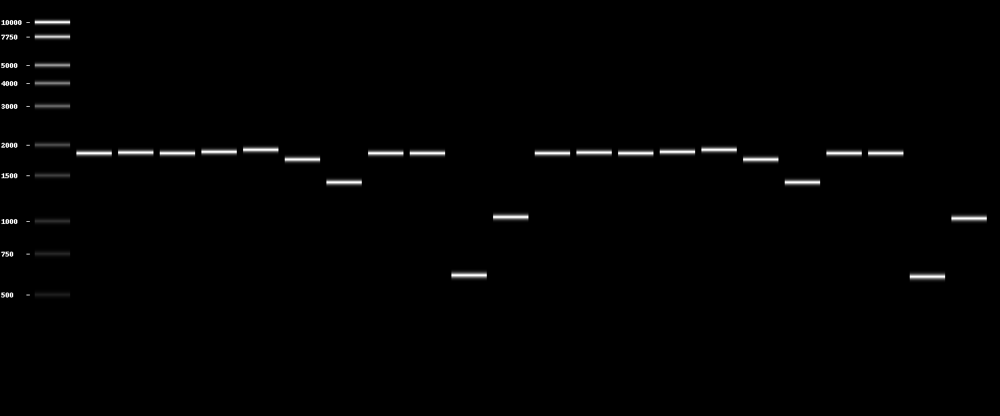

In [ ]:
row = row_amplicons("A")+row_amplicons("B")
row_no = 1
for amp in row:
    print("Row "+str(row_no)+": "+amp[0].name)
    row_no += 1
pydna.gel.gel([pydna.ladders.PennStateLadder,*row])

Row 1: PCR_G8H_03
Row 2: PCR_G8H_07
Row 3: PCR_G8H_11
Row 4: PCR_G8H_15
Row 5: PCR_G8H_19
Row 6: PCR_G8H_23
Row 7: PCR_G8H_27
Row 8: PCR_G8H_31
Row 9: PCR_G8H_35
Row 10: PCR_TRP1-DW_01
Row 11: PCR_PRO_03
Row 12: PCR_G8H_04
Row 13: PCR_G8H_08
Row 14: PCR_G8H_12
Row 15: PCR_G8H_16
Row 16: PCR_G8H_20
Row 17: PCR_G8H_24
Row 18: PCR_G8H_28
Row 19: PCR_G8H_32
Row 20: PCR_G8H_36
Row 21: PCR_PRO_04


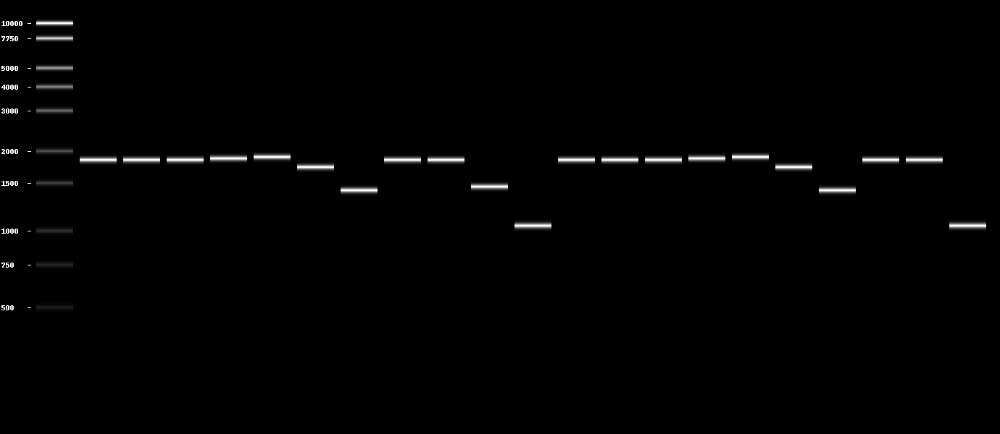

In [ ]:
row = row_amplicons("C")+row_amplicons("D")
row_no = 1
for amp in row:
    print("Row "+str(row_no)+": "+amp[0].name)
    row_no += 1
pydna.gel.gel([pydna.ladders.PennStateLadder,*row])

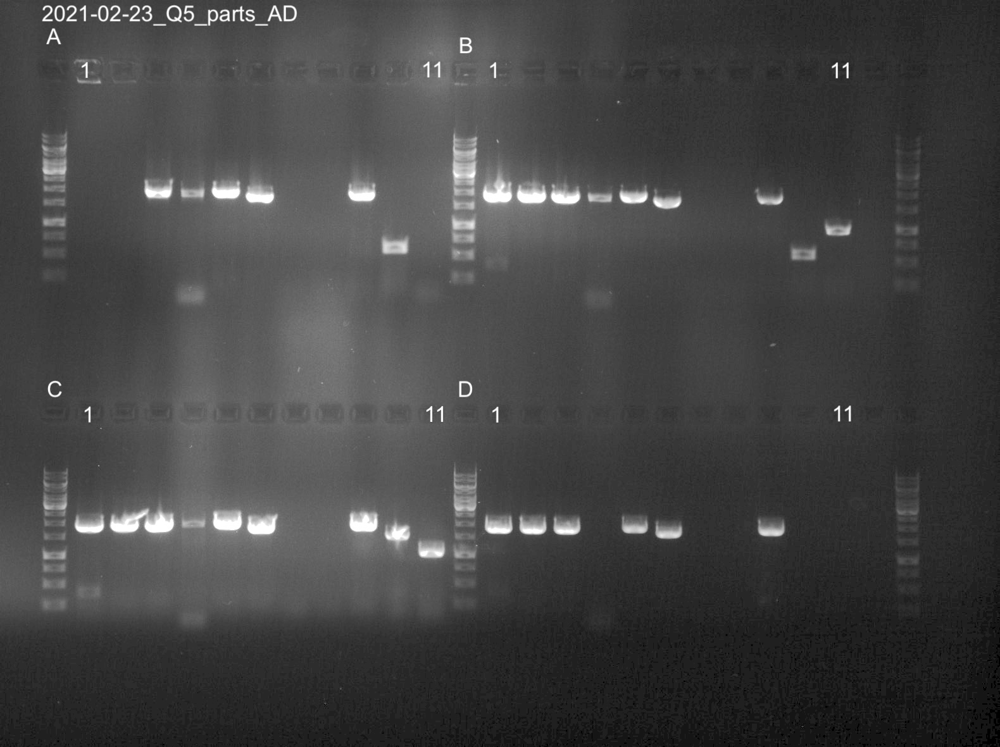

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/Data/Bioimager/2021-02-23_Q5_parts_AD.jpg', width=600)

Row 1: PCR_CPR_21
Row 2: PCR_CPR_30
Row 3: PCR_CPR_23
Row 4: PCR_CPR_29
Row 5: PCR_CPR_22
Row 6: PCR_CPR_26
Row 7: PCR_CPR_27
Row 8: PCR_CPR_28
Row 9: PCR_CPR_24
Row 10: PCR_CPR_25
Row 11: PCR_PRO_07
Row 12: PCR_CPR_31
Row 13: PCR_CPR_40
Row 14: PCR_CPR_33
Row 15: PCR_CPR_39
Row 16: PCR_CPR_32
Row 17: PCR_CPR_36
Row 18: PCR_CPR_37
Row 19: PCR_CPR_38
Row 20: PCR_CPR_34
Row 21: PCR_CPR_35
Row 22: PCR_PRO_08


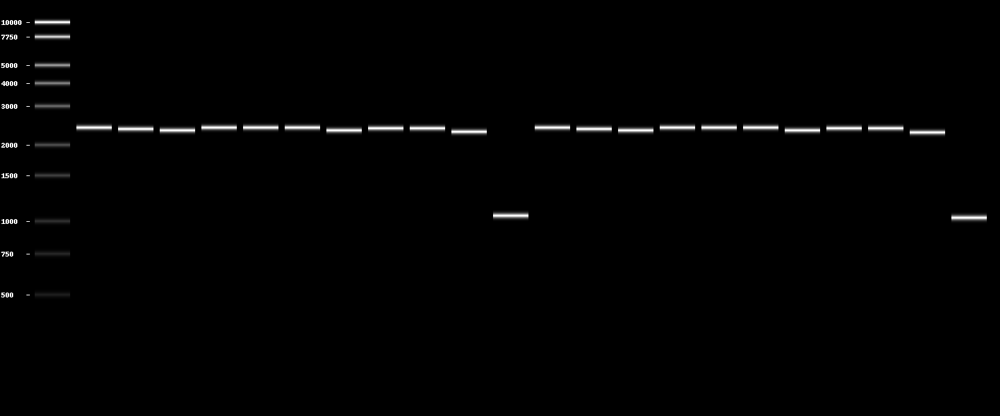

In [ ]:
row = row_amplicons("G")+row_amplicons("H")
row_no = 1
for amp in row:
    print("Row "+str(row_no)+": "+amp[0].name)
    row_no += 1
pydna.gel.gel([pydna.ladders.PennStateLadder,*row])

Row 1: PCR_CPR_01
Row 2: PCR_CPR_10
Row 3: PCR_CPR_03
Row 4: PCR_CPR_09
Row 5: PCR_CPR_02
Row 6: PCR_CPR_06
Row 7: PCR_CPR_07
Row 8: PCR_CPR_08
Row 9: PCR_CPR_04
Row 10: PCR_CPR_05
Row 11: PCR_PRO_05
Row 12: PCR_CPR_11
Row 13: PCR_CPR_20
Row 14: PCR_CPR_13
Row 15: PCR_CPR_19
Row 16: PCR_CPR_12
Row 17: PCR_CPR_16
Row 18: PCR_CPR_17
Row 19: PCR_CPR_18
Row 20: PCR_CPR_14
Row 21: PCR_CPR_15
Row 22: PCR_PRO_06


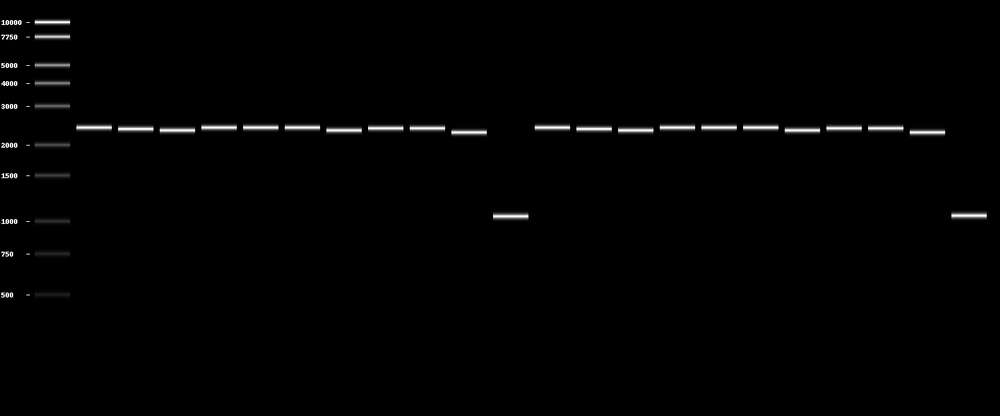

In [ ]:
row = row_amplicons("E")+row_amplicons("F")
row_no = 1
for amp in row:
    print("Row "+str(row_no)+": "+amp[0].name)
    row_no += 1
pydna.gel.gel([pydna.ladders.PennStateLadder,*row])

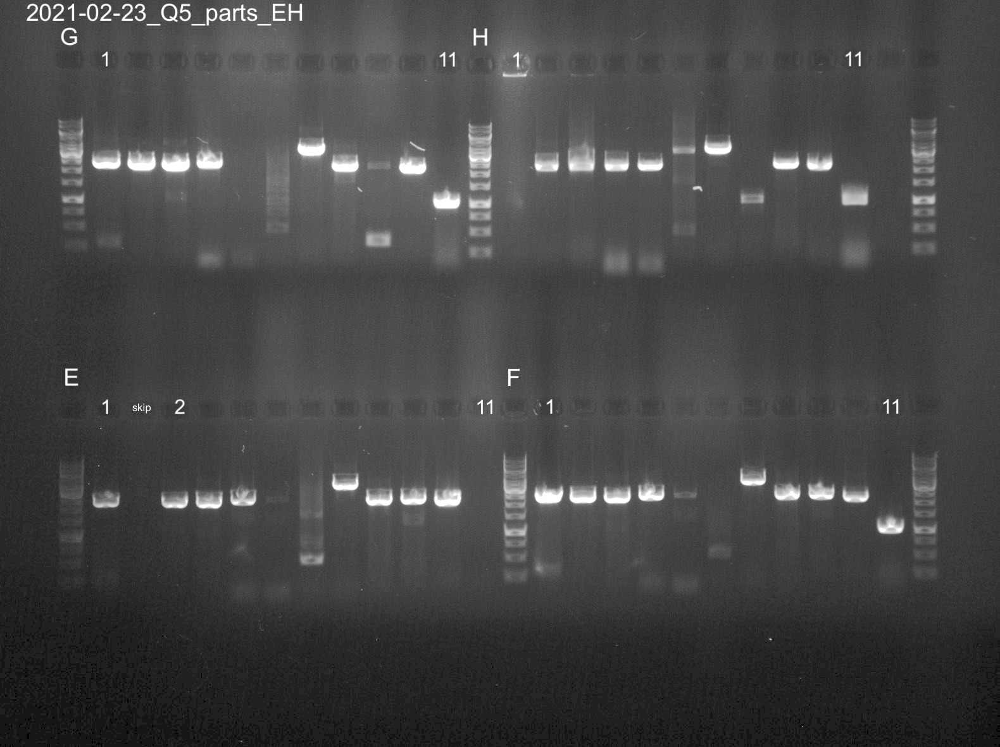

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/Data/Bioimager/2021-02-23_Q5_parts_EH.jpg', width=600)

##### Results
PCR not working: 

A:
- 1 PCR_G8H_01 #Evaporation of corner well
- 2 PCR_G8H_05 #Evaporation of side well
- 4 PCR_G8H_13 #Weak band and primer dimer
- 7 PCR_G8H_25 #No template 
- 8 PCR_G8H_29 #No template
- 11 PCR_PRO_01 #Evaporated, gDNA template

B:
- 4 PCR_G8H_14 #Weak band and primer dimer
- 7 PCR_G8H_26 #No template
- 8 PCR_G8H_30 #No template

C: 
- 4 PCR_G8H_15 #Weak band and primer dimer
- 7 PCR_G8H_27 #No template
- 8 PCR_G8H_31 #No template

D:  
- PCR_G8H_16 #Weak band and primer dimer
- 7 PCR_G8H_28 #No template
- 8 PCR_G8H_32 #No template
- 11 PCR_PRO_04 #

E:
- 5 PCR_CPR_02 #Weak band and primer dimers. 
- 6 PCR_CPR_06 #Smear
- 11 PCR_PRO_05 #No band, gDNA template

F:
- 5 PCR_CPR_12 #Weak band and primer dimers. 
- 6 PCR_CPR_16 #Smear

G: 
- 5 PCR_CPR_22 #Weak band and primer dimers. 
- 6 PCR_CPR_26 #Smear
- 9 PCR_CPR_24 #Weak band and primer dimers

H:
- 1 PCR_CPR_31 #evaporation of corner well
- 6 PCR_CPR_36 #Weak band, unspecific band ~500bp and smear. 
- 8 PCR_CPR_38 #~1000 bp too short

AniCPR_tCYC1: #A bit longer than the other CPR (H7, E7, F7, G7)
   - PCR_CPR_27, PCR_CPR_07, PCR_CPR_17, PCR_CPR_37
   - Result: Amplicons ~200 bp longer than benchling record (PL_13_E9_(pRS415U-P2_TEF-AniCPR_opt2)).
   - Conclusion: Send plasmid for sequencing.
   
For
1. Row A-D column 4 (CacuG8H)
2. Row E-H column 5 (RseCPR)
3. Row E-H column 6 (AhuCPR)

Weak or no band. primer dimers. 

Works: Polymerase, template, primers, elongation time, Annealing temperature?

1. At = 63! (NEB tm calculator)
2. At = 61
3. At = 61, Forward primer At = 65!

Conclusion: redo PCR with At 60 and volume 50. 
Also add templates p1_H01 (just miniprep'ed) for col 8 row A-D 

##### Conclusion: 
- redo PCR with At 60 and volume 50. 
- Redo PCR with higher volumes and in two PCR plates. A-B and C-H to avoid evaporation. 
- Also add templates p1_H01 (OeuG8H;just miniprep'ed) for col 8 row A-D 

PCR
- Polymerase: Q5 2x MasterMix [protocol](https://international.neb.com/protocols/2012/08/30/protocol-for-q5-hot-start-high-fidelity-2x-master-mix-m0494)
- Program: Create according to protocol
- Elongation time: 1.5 min (30 s/ kb)
- Annealing temp 60
    - All primers are designed to have 3' Tm 59C-54C, and Ta 59C-62C when using  Q5 2x MasterMix (calculated with NEB Tm calculator)

In [ ]:
pcr_volumes(vol_p_reac = 50, 
        no_of_reactions = 100,
        standard_reagents = ["Template", "Primer 1", "Primer 2", "H20", "Pol"],
        standard_volumes = [1, 2.5, 2.5, 19, 25])

,vol_p_reac,vol_p_100_reac
Template,1.0,100.0
Primer 1,2.5,250.0
Primer 2,2.5,250.0
H20,19.0,1900.0
Pol,25.0,2500.0
Total,50.0,5000.0


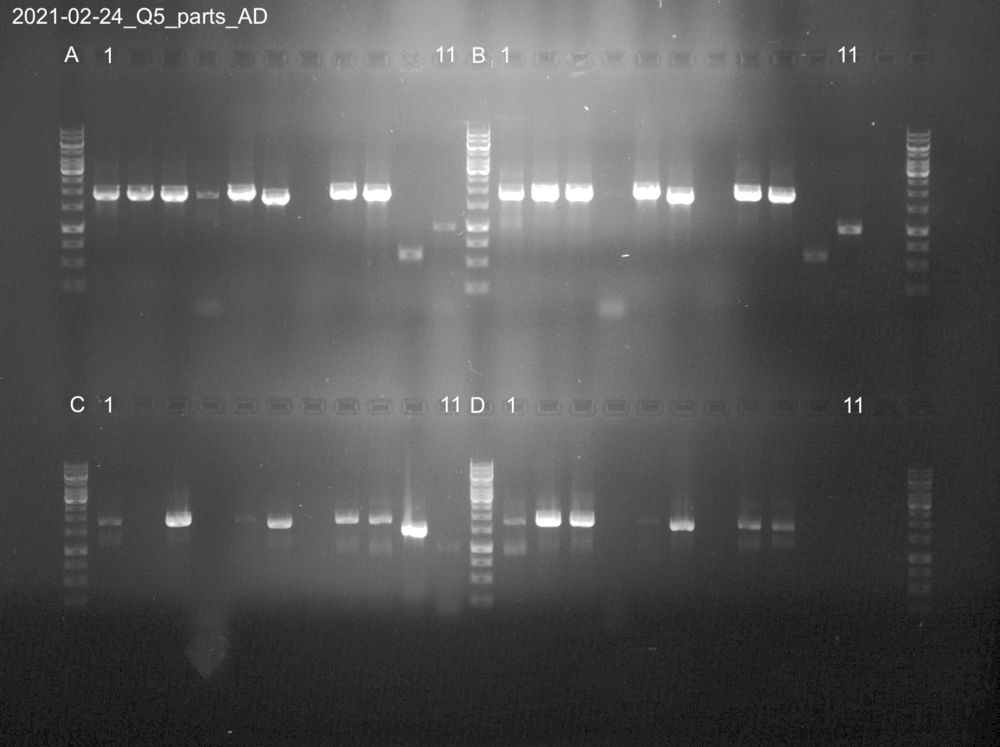

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/Data/Bioimager/2021-02-24_Q5_parts_AD.jpg', width=600)

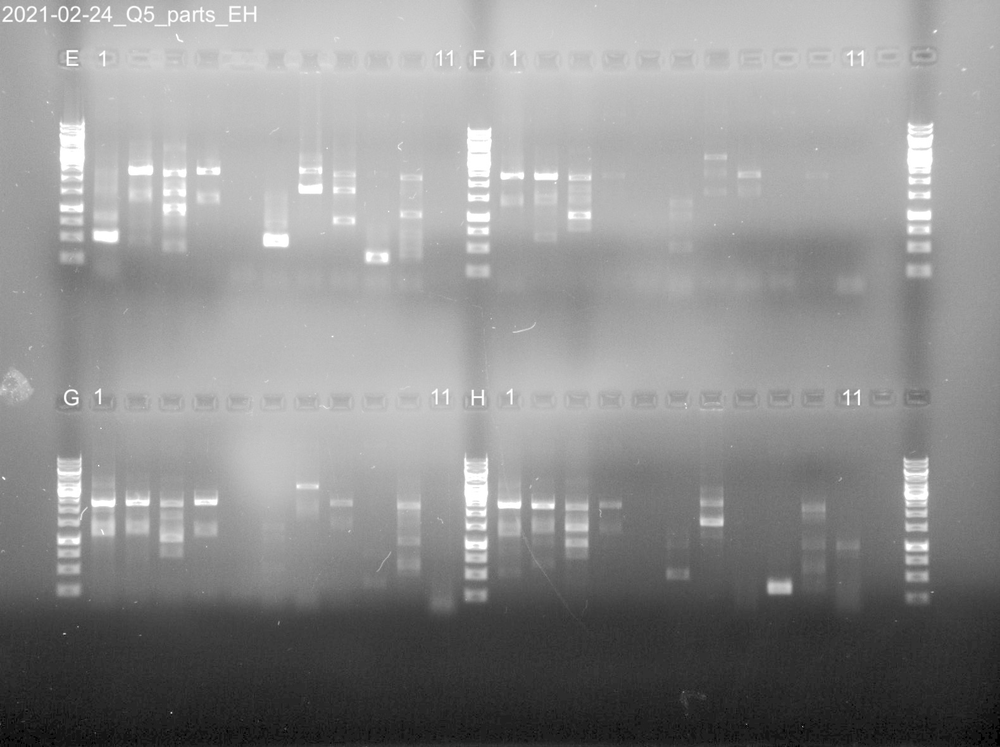

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/Data/Bioimager/2021-02-24_Q5_parts_EH.jpg', width=600)

**Results**:
1. No evaporation from wells.
    - Band now appearing for A: 1,2, and 11 and H1. 
2. new template reactions in col 8 row A-D (OeuG8H) worked
3. Unspecific bands appearing for Rows C-H!

For:
- Row A-D column 4 (CacuG8H)
- Row E-H column 5 (RseCPR)
- Row E-H column 6 (AhuCPR)
weak or no band. primer dimers. 

**Discussion**

1. Evaporation: Avoiding corner and side seems to work! Use as workaround when plate seals are not tight.

2. Increasing At: to 60 didn't help the 12 specific reactions nor primer dimers. Go back to At 58 

3. Unspecific bands, why do they appear? correlate with PCR cycler 006. Problem with cycler temperature control? **Maybe because we pulled out the plate after heating to 98 (hot start polymerase) to add new template reactions?** Did Christine start this cycler 006 first then cycler 003? (Christine started 003 first and then 006 )
   - higher At should decrease amount of unspecific bands not increase it

4. We need:
- ~ 90 more UP, DW, TRP parts than G8H/CPR parts 
- ~ 4 times less promoter parts than UP and DW
Our reactions for all three are working at At 58.

Promoters 6 out of 8 working (col 11 A-H).
D (pTPI1) and E (pURE2) not working 


**Conclusion**
- A1-B11 pool and column purify (day 23&24 samples)
- Redo C1-H11 with At=58,  Vol=50, PCR cycler (not 600), design to avoid corner/side wells

Furthermore

Make (8x 50 µl reaction of each):
- TRP C10
- promoters 11A-C and F-H
- UP A10
- DW B10

For UP and DW use onetaq. Low errorrate not necessary.


C1-B11 redo:
PCR
- Polymerase: Q5 2x MasterMix [protocol](https://international.neb.com/protocols/2012/08/30/protocol-for-q5-hot-start-high-fidelity-2x-master-mix-m0494)
- Program: Create according to protocol
- Elongation time: 1.5 min (30 s/ kb)
- Annealing temp 58

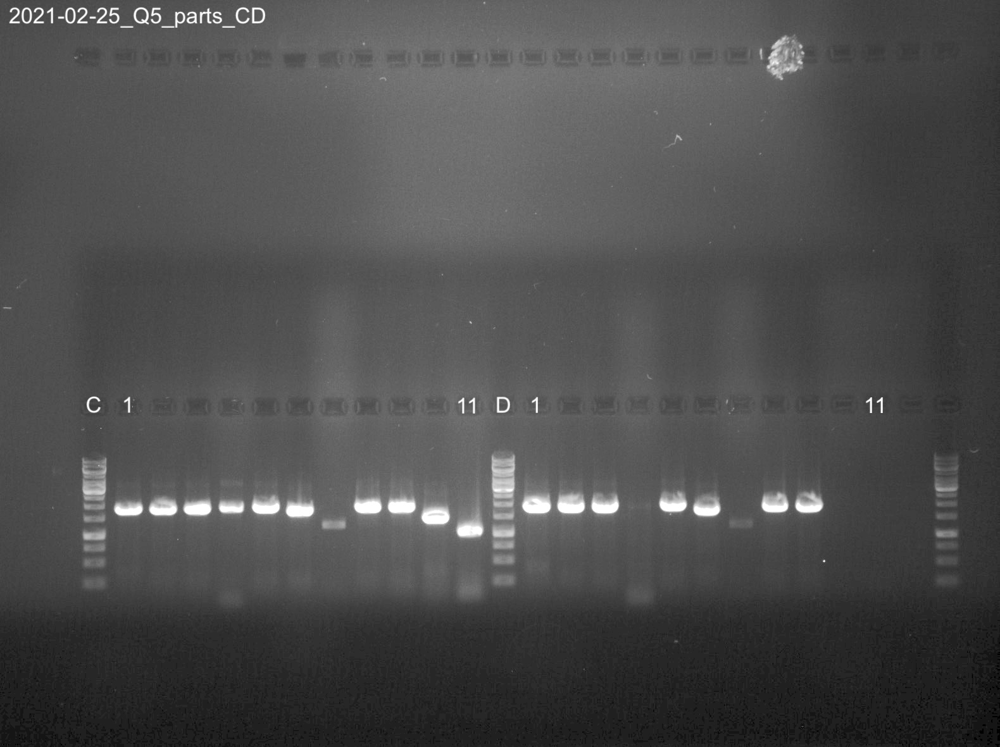

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/Data/Bioimager/2021-02-25_Q5_parts_CD.jpg', width=600)

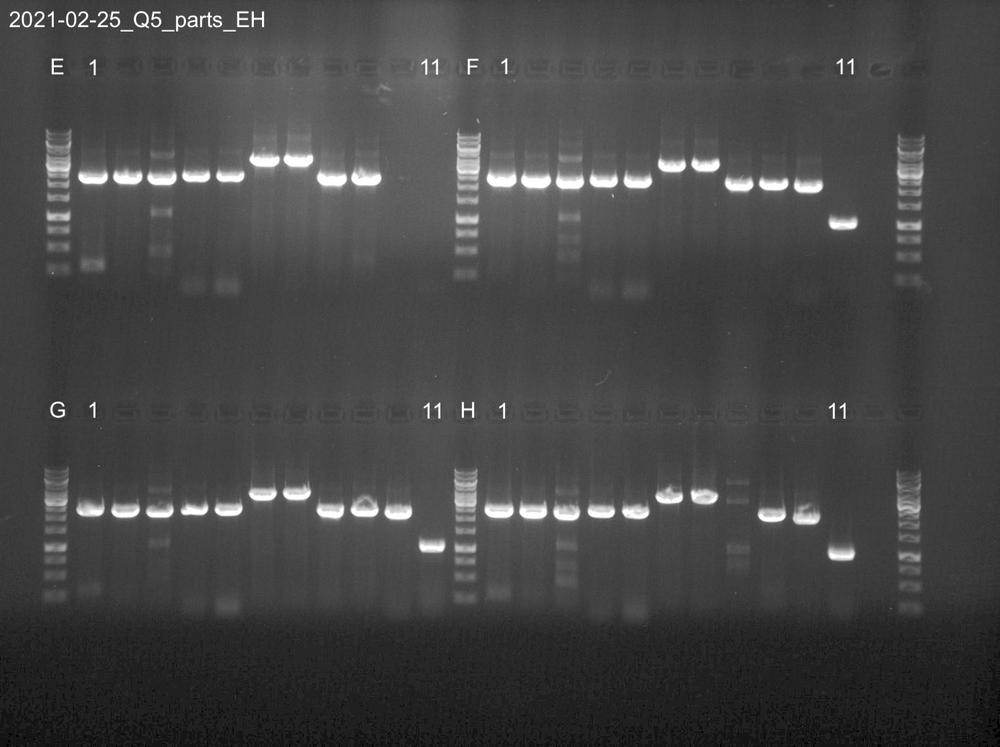

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/Data/Bioimager/2021-02-25_Q5_parts_EH.jpg', width=600)

**Results**

**Discussion**
- many bands has weak larger band that follows the band size. What is that?
- C and D col 11 i.e. promoters pTPI1 (D) and pURE2 (E) are not working. 
- C and D has band in col 7! shouldn't be there. contamination. Good part is that the band is shorter than others. And the other doesn't have that band and all have expected sizes. Maybe use of non-sterile water

**Conclusion**
- Troubleshoot C and D col 11

In [ ]:
for col in row_amplicons("D"):
    for co in col:
        print(co.name)

PCR_G8H_04
PCR_G8H_08
PCR_G8H_12
PCR_G8H_16
PCR_G8H_20
PCR_G8H_24
PCR_G8H_28
PCR_G8H_32
PCR_G8H_36
PCR_PRO_04


In [ ]:
pname = "pTPI1"
pAmp = row_amplicons("D")[8][0]
print(pname, pAmp.name, len(pAmp))
print(pAmp.forward_primer.footprint)
print(pAmp.reverse_primer.footprint)
pTPI1 = pAmp

pTPI1 PCR_G8H_36 1839
GAGCGACCTCATGCTATAC
ATGGATTACTTAACTATTGTCCTGG


In [ ]:
pname = "pURE2"
pAmp = row_amplicons("E")[10][0]
print(pname, pAmp.name, len(pAmp))
print(pAmp.forward_primer.footprint)
print(pAmp.reverse_primer.footprint)
pURE2 = pAmp

pURE2 PCR_PRO_05 1041
CAAGCTGAACTCGCTGAA
TTGGTGTAGAACTTAATTTGCAG


**Results**

Q5
- pTPI1, tm fw 62 rv 57, At 58
- pURE2, tm fw 62 rv 60, At 61

OneTaq
- pTPI1, tm fw 54 rv 50, At 45
- pURE2, tm fw 55 rv 53, At 48

**Discussion**
Try:
- another template?
    - Do we have a plasmid template? For pTPI1? MIA-CM-3 already have pTPI1 at X-4. Problem?
- other primers? 
    - well D12 empty (double check) in mixed primer plate. Might explain missing pTPI1
    - go back to primers from op4, not mixed plate
    - Order new ?

**Conclusion**
- First: Try Onetaq, Touchdown starting 48, 51, use primers from op4 (not premixed), template MIA-HA-1 col # 3

In [ ]:
pcr_volumes(vol_p_reac = 50, 
        no_of_reactions = 1,
        standard_reagents = ["Template", "Primer 1", "Primer 2", "H20", "Pol"],
        standard_volumes = [1, 2.5, 2.5, 19, 25])

,vol_p_reac,vol_p_1_reac
Template,1.0,1.0
Primer 1,2.5,2.5
Primer 2,2.5,2.5
H20,19.0,19.0
Pol,25.0,25.0
Total,50.0,50.0


In [ ]:
missing_promoter_amplicons = [pTPI1] * 1 + [pURE2] * 1

In [ ]:
# THIS IS NOT WORKING ATM
#pcr_locations(missing_promoter_amplicons)

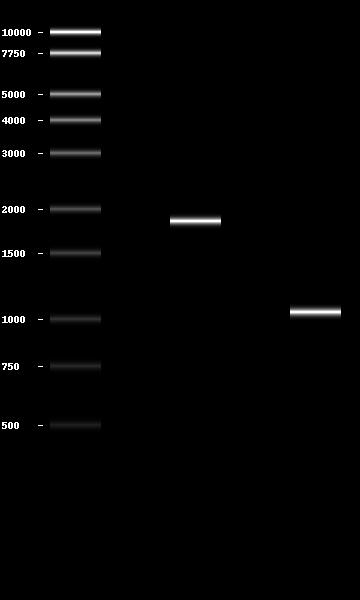

In [ ]:
pydna.gel.gel([pydna.ladders.PennStateLadder, [],[missing_promoter_amplicons[0]], [],[missing_promoter_amplicons[1]]])

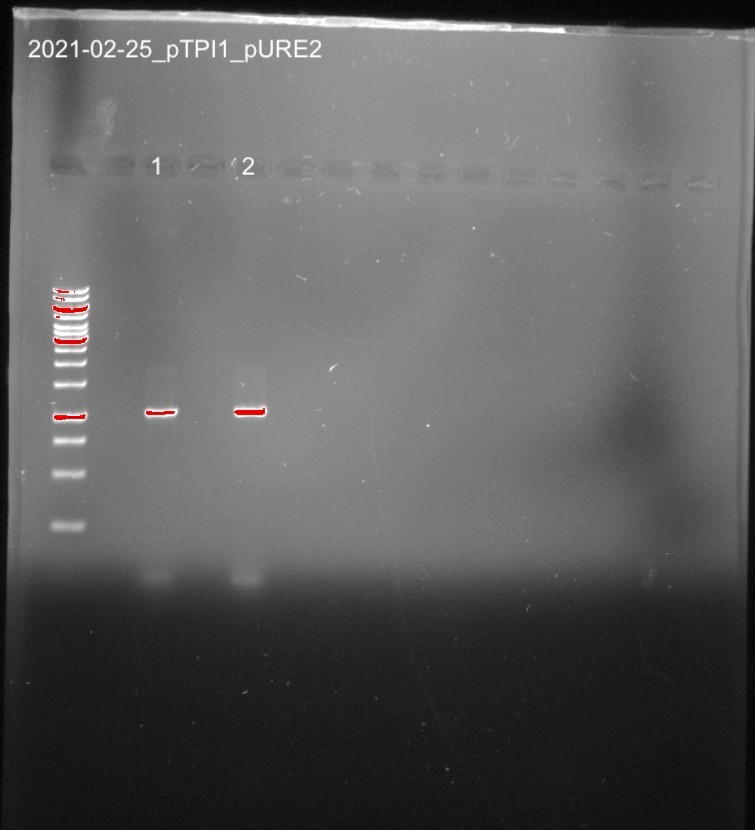

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/Data/Bioimager/2021-02-25_pTPI1_pURE2.jpg', width=300)

**Results**
- works

**Conclusion**
- Try same with Q5
- At pTPI1 58, pURE2 61

In [ ]:
pcr_volumes(vol_p_reac = 50, 
        no_of_reactions = 1,
        standard_reagents = ["Template", "Primer 1", "Primer 2", "H20", "Pol"],
        standard_volumes = [1, 2.5, 2.5, 19, 25])

,vol_p_reac,vol_p_1_reac
Template,1.0,1.0
Primer 1,2.5,2.5
Primer 2,2.5,2.5
H20,19.0,19.0
Pol,25.0,25.0
Total,50.0,50.0


In [ ]:
missing_promoter_amplicons = [pTPI1] * 1 + [pURE2] * 1

In [ ]:
#pcr_locations(missing_promoter_amplicons)

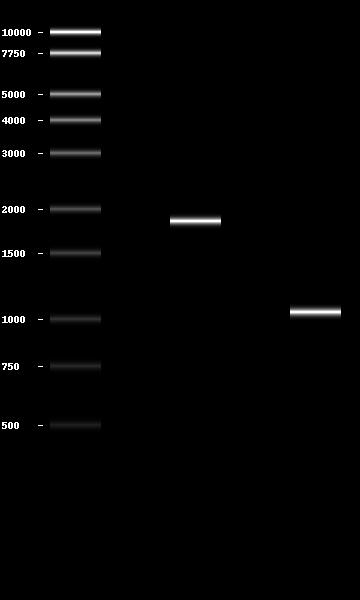

In [ ]:
pydna.gel.gel([pydna.ladders.PennStateLadder, [],[missing_promoter_amplicons[0]], [],[missing_promoter_amplicons[1]]])

In [ ]:
IPython.core.display.Image('../data/figures/2021-02-25_Q5_pTPI1_pURE2_cTRP.jpg', width=300)

**Results**
- works

**Conclusion**
- Amplify 4x 50 µl of all promoter with Q5
- At pTPI1 58, pURE2 61
- Template = MIA-HA-1 col # 3 

In [ ]:
def amplicon_inf_col(col,row_no):

    promoter_amp = col_amplicons(col)[row_no][0]
    
    return promoter_amp

In [ ]:
promoter_amplicons = [amplicon_inf_col(11,row_no) for row_no in range(0,8)]

In [ ]:
promoter_amplicons[0].template.annotations

{'batches': [{'accessions': ['seq_DPrPIMvy'],
   'batches': [{'concentration:': 120, 'location': 'l4_A01', 'volume': 20}],
   'data_file_division': 'UNK',
   'date': '01-JAN-1980',
   'keywords': [''],
   'molecule_type': 'DNA',
   'organism': '.',
   'source': '',
   'taxonomy': []}],
 'molecule_type': 'DNA'}

In [ ]:
#pcr_locations(promoter_amplicons)

Make 4x50µl reactions

In [ ]:
promoter_amplicons4 = list(itertools.chain.from_iterable(itertools.repeat(pamp, 4) for pamp in promoter_amplicons))
#promoter_amplicons4

Mastermix

In [ ]:
pcr_volumes(vol_p_reac = 50, 
        no_of_reactions = len(promoter_amplicons4) + 3,
        standard_reagents = ["Template", "Primer 1", "Primer 2", "H20", "Pol"],
        standard_volumes = [1, 2.5, 2.5, 19, 25])

,vol_p_reac,vol_p_35_reac
Template,1.0,35.0
Primer 1,2.5,87.5
Primer 2,2.5,87.5
H20,19.0,665.0
Pol,25.0,875.0
Total,50.0,1750.0


PCR Program

Determine:
- polymerase
- processing speed
- elongation time
- annealing temperature

Print settings:

In [ ]:
prom_map = {
    'PCR_PRO_01':'pCYC1',
    'PCR_PRO_02':'pCCW12',
    'PCR_PRO_03':'pMLS1',
    'PCR_PRO_04':'pTPI1',
    'PCR_PRO_05':'pURE2',
    'PCR_PRO_06':'pENO2',
    'PCR_PRO_07':'pPCK1',
    'PCR_PRO_08':'pRPL15B'}

In [ ]:
def print_pcr_settings(amplicon):
    pname = prom_map[amplicon.name]
    print(amplicon.name, pname)
    print("Etime: " + str(amplicon.annotations['elongation_time']) + " s")
    print('ta '  + str(amplicon.annotations['ta ' + pol]))
    print()

In [ ]:
for pamp in promoter_amplicons:
    print_pcr_settings(pamp)

PCR_PRO_01 pCYC1
Etime: 31 s
ta 60

PCR_PRO_02 pCCW12
Etime: 31 s
ta 61

PCR_PRO_03 pMLS1
Etime: 32 s
ta 58

PCR_PRO_04 pTPI1
Etime: 32 s
ta 58

PCR_PRO_05 pURE2
Etime: 32 s
ta 61

PCR_PRO_06 pENO2
Etime: 32 s
ta 61

PCR_PRO_07 pPCK1
Etime: 32 s
ta 60

PCR_PRO_08 pRPL15B
Etime: 31 s
ta 61



How many different thermal cyclers?

In [ ]:
thermal_cyclers = det_no_of_thermal_cyclers(promoter_amplicons, polymerase=pol) # pol
thermal_cyclers

,tas,elong_times,amplicons
0,58,32,"PCR_PRO_03, PCR_PRO_04"
1,60,32,"PCR_PRO_01, PCR_PRO_07"
2,61,32,"PCR_PRO_02, PCR_PRO_05, PCR_PRO_06, PCR_PRO_08"


In [ ]:
import textwrap as _textwrap

In [ ]:
from pydna._pretty import pretty_str as _pretty_str

In [ ]:
def Q5_program(amplicon):
    r"""Returns a string containing a text representation of a suggested
    PCR program using Taq or similar polymerase.
    ::
     |98°C|98°C               |    |tmf:59.5
     |____|_____          72°C|72°C|tmr:59.7
     |30s |10s  \ 59.1°C _____|____|30s/kb
     |    |      \______/ 0:32|5min|GC 51%
     |    |       30s         |    |1051bp
    """

    f = _textwrap.dedent(
        r"""
                            |98°C|98°C               |    |tmf:{tmf:.1f}
                            |____|_____          72°C|72°C|tmr:{tmr:.1f}
                            |30 s|10s  \ {ta:.1f}°C _____|____|{rate}s/kb
                            |    |      \______/{0:2}:{1:2}|2min|GC {GC_prod}%
                            |    |       20s         |    |{size}bp
                            """[
            1:-1
        ].format(
            rate=amplicon.annotations['proc_speed'],
            size=len(amplicon.seq),
            ta=amplicon.annotations['ta Q5 Hot Start'],
            tmf=amplicon.forward_primer.annotations['tm Q5 Hot Start'],
            tmr=amplicon.reverse_primer.annotations['tm Q5 Hot Start'],
            GC_prod=int(amplicon.gc()),
            *map(int, divmod(amplicon.annotations['elongation_time'], 60)),
        )
    )

    return _pretty_str(f)

In [ ]:
Q5_program(promoter_amplicons[0])

|98°C|98°C               |    |tmf:59.0
|____|_____          72°C|72°C|tmr:59.0
|30 s|10s  \ 60.0°C _____|____|30s/kb
|    |      \______/ 0:31|2min|GC 0%
|    |       20s         |    |1033bp


Only load one of each

In [ ]:
amplicons[0]

Amplicon(609)

In [ ]:
type(amplicons[0])

pydna.amplicon.Amplicon

In [ ]:
amplicons[0].program()

|95°C|95°C               |    |tmf:57.3
|____|_____          72°C|72°C|tmr:56.6
|3min|30s  \ 55.6°C _____|____|45s/kb
|    |      \______/ 0:30|5min|GC 43%
|    |       30s         |    |609bp

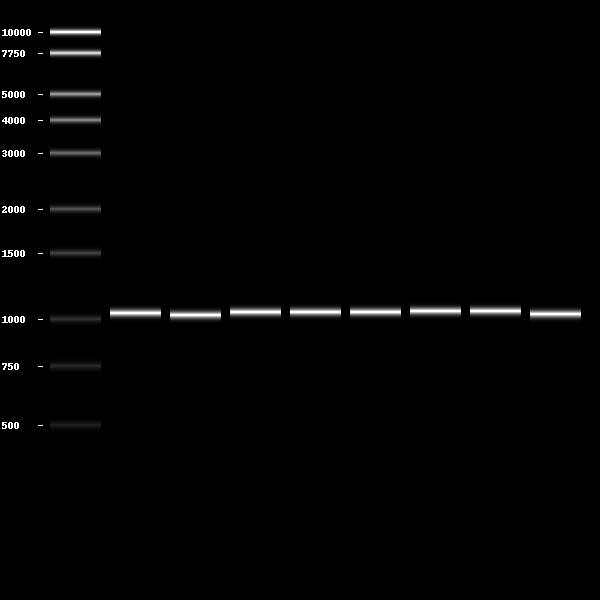

In [ ]:
pydna.gel.gel([pydna.ladders.PennStateLadder,*[[pamp] for pamp in promoter_amplicons]])

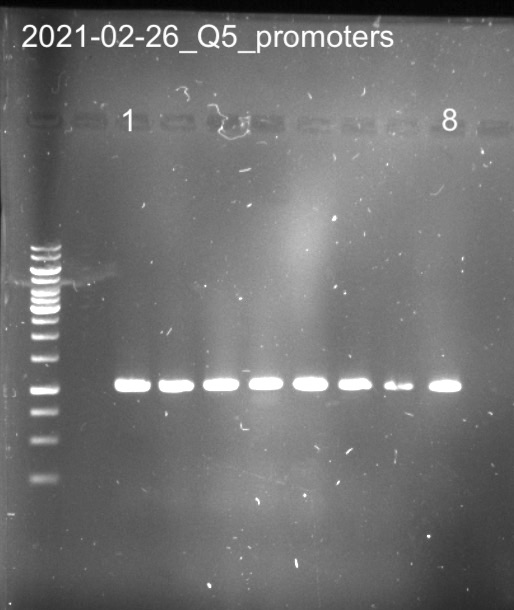

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/Data/Bioimager/2021-02-26_Q5_promoters.jpg', width=300)

In [ ]:
pname = "XI-2_UP"
pAmp = row_amplicons("A")[8][0]
print(pname, pAmp.name, len(pAmp))
print("fw footprint: ",pAmp.forward_primer.footprint)
print("rv footprint: ",pAmp.reverse_primer.footprint)
UP = pAmp

XI-2_UP PCR_G8H_33 1845
fw footprint:  GAGCGACCTCATGCTATAC
rv footprint:  ATGGATTACTTAACTATTGTCCTGG


In [ ]:
pname = "XI-2_DW"
pAmp = row_amplicons("B")[9][0]
print(pname, pAmp.name, len(pAmp))
print("fw footprint: ",pAmp.forward_primer.footprint)
print("rv footprint: ",pAmp.reverse_primer.footprint)
DW = pAmp

XI-2_DW PCR_TRP1-DW_02 599
fw footprint:  CACACGACTAGCGCT
rv footprint:  GTGGGAAGATTCCGCT


Do
- up A10
- dw B10
PCR
- Polymerase: OneTaq 2xMM [protocol](https://international.neb.com/protocols/2012/09/06/protocol-for-onetaq-2x-master-mix-with-standard-buffer-m0482)
- Template MIA-HA-1 col 3 gDNA prep, 0.5 ul 50 µl reaction
- Program: Create according to protocol
- Elongation time: 1 min (60 s/ kb)
- Annealing temp 47 (UP) / 49 (DW) [tm calculator](https://tmcalculator.neb.com/#!/main)

In [ ]:
pcr_volumes(vol_p_reac = 50, 
        no_of_reactions = 35,
        standard_reagents = ["Template", "Primer 1", "Primer 2", "H20", "Pol"],
        standard_volumes = [1, 2.5, 2.5, 19, 25])

,vol_p_reac,vol_p_35_reac
Template,1.0,35.0
Primer 1,2.5,87.5
Primer 2,2.5,87.5
H20,19.0,665.0
Pol,25.0,875.0
Total,50.0,1750.0


In [ ]:
UP_DW_amplicons = [UP] * 16 + [DW] *16 

In [ ]:
pcr_locations(UP_DW_amplicons)

,location,name,template,fw,rv
0,l5_D08,PCR_G8H_33,l5_D08,op4_A10,op4_A09
1,l5_D08,PCR_G8H_33,l5_D08,op4_A10,op4_A09
2,l5_D08,PCR_G8H_33,l5_D08,op4_A10,op4_A09
3,l5_D08,PCR_G8H_33,l5_D08,op4_A10,op4_A09
4,l5_D08,PCR_G8H_33,l5_D08,op4_A10,op4_A09
5,l5_D08,PCR_G8H_33,l5_D08,op4_A10,op4_A09
6,l5_D08,PCR_G8H_33,l5_D08,op4_A10,op4_A09
7,l5_D08,PCR_G8H_33,l5_D08,op4_A10,op4_A09
8,l5_D08,PCR_G8H_33,l5_D08,op4_A10,op4_A09
9,l5_D08,PCR_G8H_33,l5_D08,op4_A10,op4_A09


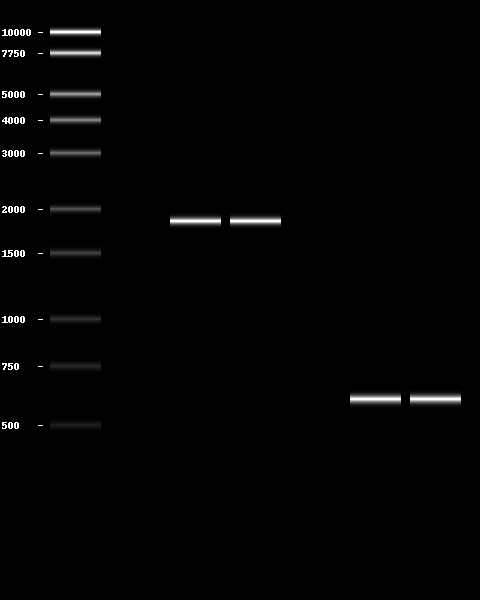

In [ ]:
pydna.gel.gel([pydna.ladders.PennStateLadder, [],[UP_DW_amplicons[0]], [UP_DW_amplicons[1]], [],[UP_DW_amplicons[16]], [UP_DW_amplicons[17]]])

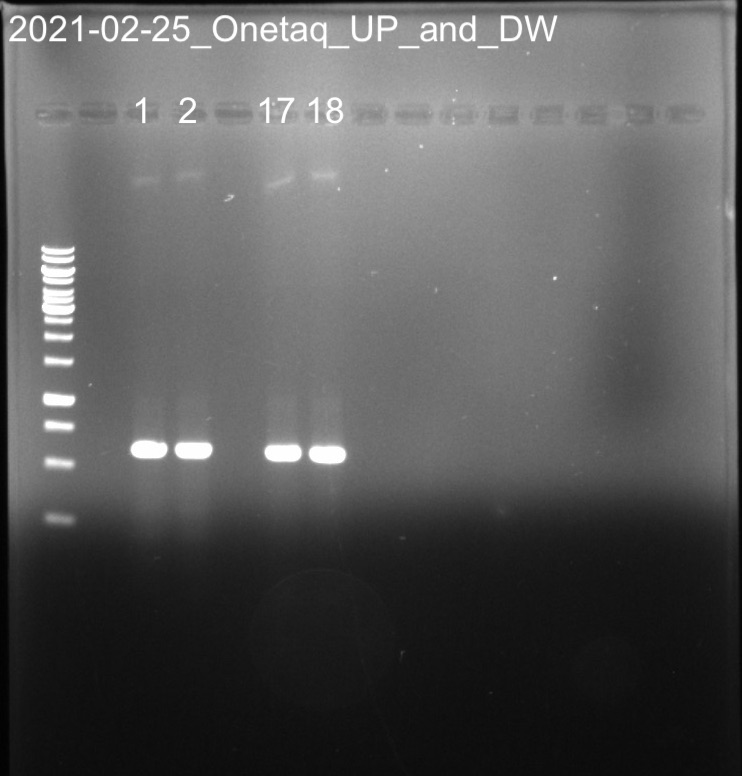

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/Data/Bioimager/2021-02-25_Onetaq_UP_and_DW.jpg', width=300)

In [ ]:
pname = "cTRP"
pAmp = row_amplicons("C")[8][0]
print(pname, pAmp.name, len(pAmp))
print("fw footprint: ",pAmp.forward_primer.footprint)
print("rv footprint: ",pAmp.reverse_primer.footprint)
cTRP = pAmp

cTRP PCR_G8H_35 1841
fw footprint:  GAGCGACCTCATGCTATAC
rv footprint:  ATGGATTACTTAACTATTGTCCTGG


Do
- cTRP C10

PCR
- Polymerase: Q5 2x MasterMix [protocol](https://international.neb.com/protocols/2012/08/30/protocol-for-q5-hot-start-high-fidelity-2x-master-mix-m0494)
- Program: Create according to protocol
- Elongation time: 1 min (30 s/ kb)
- Annealing temp 58

In [ ]:
pcr_volumes(vol_p_reac = 50, 
        no_of_reactions = 17,
        standard_reagents = ["Template", "Primer 1", "Primer 2", "H20", "Pol"],
        standard_volumes = [1, 2.5, 2.5, 19, 25])

,vol_p_reac,vol_p_17_reac
Template,1.0,17.0
Primer 1,2.5,42.5
Primer 2,2.5,42.5
H20,19.0,323.0
Pol,25.0,425.0
Total,50.0,850.0


In [ ]:
cTRP_amplicon = [cTRP] 

In [ ]:
pcr_locations(cTRP_amplicon)

,location,name,template,fw,rv
0,l5_E01,PCR_G8H_35,l5_E01,op4_A10,op4_C09


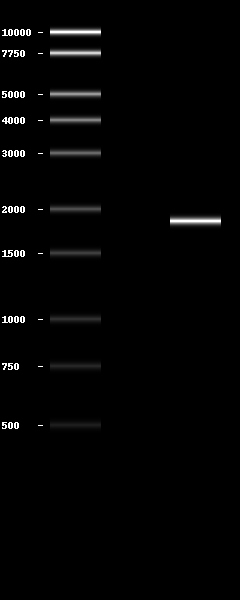

In [ ]:
pydna.gel.gel([pydna.ladders.PennStateLadder, [],cTRP_amplicon])

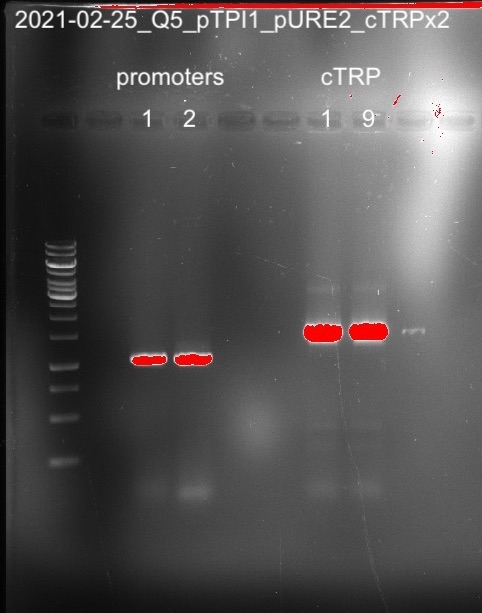

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/Data/Bioimager/2021-02-25_Q5_pTPI1_pURE2_cTRP.jpg', width=300)

gel purify if unspecific band that is not primer dimer. Primer dimers should be removed by column purification

#### Add pcrs concentration and volume to storage digitally (Benchling batch information)

#### Add pcrs to storage physical

#### Retrieve pcrs concentration and volume from Benchling

In [ ]:
# workaround
for comb_no in range(0, no_combs):
    for frag_no in range(0, no_frags):
        amplicon_matrix[comb_no][frag_no].annotations['volume'] = 50 
        amplicon_matrix[comb_no][frag_no].annotations['concentration'] = 100

## Assemblies

Before constructing the entire library we start by constructing a few selected strains to check if our strategy works:
- all 16 promoter combinations for croG8H and croCPR

| Name | Parent | gRNA (500 ng) | Parts (300 ng) |
| --- | --- | --- | --- |
| MIA-HA-(2-17) | MIA-HA-1 | pESC-URA-gRNA_XI2-2 | 7 fragments | 

Amplicons needed

In [ ]:
cro_UP_names      = ['PCR_UP_tADH1_01']
cro_G8H_names     = ['PCR_G8H_21','PCR_G8H_22','PCR_G8H_23','PCR_G8H_24']
cro_pG8H_names    = ['PCR_PRO_01','PCR_PRO_06','PCR_PRO_07','PCR_PRO_08']
cro_pCPR_names    = ['PCR_PRO_05','PCR_PRO_04','PCR_PRO_03','PCR_PRO_02']
cro_CPR_names     = ['PCR_CPR_01','PCR_CPR_11','PCR_CPR_21','PCR_CPR_31']
cro_marker_names  = ['PCR_TRP1-DW_01']
cro_DW_names      = ['PCR_TRP1-DW_02']

In [ ]:
from ConStrain_on_google_colab.Script.PCR import amplicon_by_name

Correct order:

PCR_PRO_01 pCYC1     PCR_G8H_21
PCR_PRO_06 pENO2     PCR_G8H_22
PCR_PRO_07 pPCK1     PCR_G8H_23
PCR_PRO_08 pRPL15B   PCR_G8H_24

PCR_PRO_05 pURE2     PCR_CPR_01
PCR_PRO_04 pTPI1     PCR_CPR_11
PCR_PRO_03 pMLS1     PCR_CPR_21
PCR_PRO_02 pCCW12    PCR_CPR_31

In [ ]:
G8H_map = {
    'PCR_PRO_01' :  'PCR_G8H_21',    #pCYC1   
    'PCR_PRO_06' :  'PCR_G8H_22',    #pENO2   
    'PCR_PRO_07' :  'PCR_G8H_23',    #pPCK1   
    'PCR_PRO_08' :  'PCR_G8H_24'     #pRPL15B     
}

In [ ]:
CPR_map = {
    'PCR_PRO_05' :  'PCR_CPR_01',    #pURE2  
    'PCR_PRO_04' :  'PCR_CPR_11',    #pTPI1  
    'PCR_PRO_03' :  'PCR_CPR_21',    #pMLS1  
    'PCR_PRO_02' :  'PCR_CPR_31'     #pCCW12     
}

In [ ]:
cro_UP_sites      = [amplicon_by_name(name, amplicons) for name in cro_UP_names    ]
cro_G8H_sites     = [amplicon_by_name(name, amplicons) for name in cro_G8H_names   ]
cro_pG8H_sites    = [amplicon_by_name(name, amplicons) for name in cro_pG8H_names  ]
cro_pCPR_sites    = [amplicon_by_name(name, amplicons) for name in cro_pCPR_names  ]
cro_CPR_sites     = [amplicon_by_name(name, amplicons) for name in cro_CPR_names   ]
cro_marker_sites  = [amplicon_by_name(name, amplicons) for name in cro_marker_names]
cro_DW_sites      = [amplicon_by_name(name, amplicons) for name in cro_DW_names    ]

In [ ]:
cro_G8H_pG8H_names = list(zip(cro_G8H_names,cro_pG8H_names))
cro_G8H_pG8H_sites = list(zip(cro_G8H_sites,cro_pG8H_sites))
cro_CPR_pCPR_names = list(zip(cro_CPR_names,cro_pCPR_names))
cro_CPR_pCPR_sites = list(zip(cro_CPR_sites,cro_pCPR_sites))

In [ ]:
#Create a list of fragments within a list of parts.
cro_fragment_list = [cro_UP_sites,cro_G8H_pG8H_sites,cro_CPR_pCPR_sites,cro_marker_sites,cro_DW_sites]

#The number of fragments to be assembled
cro_no_frags = len(cro_fragment_list)
print("Number of fragments:", cro_no_frags)

#The number of parts of each fragment
cro_no_parts = [len(l) for l in cro_fragment_list]
print("Number of parts: ",cro_no_parts)

#The number of possible combinations
cro_no_combs = multiplyList(cro_no_parts)
print("Number of possible combinations:",cro_no_combs)

#How many repitions are needed?
cro_repetition_list = [int(cro_no_comb/cro_no_part) for cro_no_comb, cro_no_part in zip([cro_no_combs]*len(cro_no_parts),cro_no_parts)]
print("The number of time each fragment must be repeated:", cro_repetition_list)

#Matrix with all combinations
print("\nCombinations:")
cro_combinations_matrix = [t for t in itertools.product(*cro_fragment_list)]
flat_cro_combinations_matrix = []
for row in cro_combinations_matrix:
    temp = []
    for i, ele in enumerate(row):
        if not isinstance(ele, tuple):
            temp.append(ele)
        else:
            if i == 1:
                temp.append(ele[0])
                temp.append(ele[1])
            elif i == 2:
                temp.append(ele[1])
                temp.append(ele[0])
    flat_cro_combinations_matrix.append(temp)

for row in flat_cro_combinations_matrix:
    names = []
    for element in row:
        names.append(element.name)
    print(names)

Number of fragments: 5
Number of parts:  [1, 4, 4, 1, 1]
Number of possible combinations: 16
The number of time each fragment must be repeated: [16, 4, 4, 16, 16]

Combinations:
['PCR_UP_tADH1_01', 'PCR_G8H_21', 'PCR_PRO_01', 'PCR_PRO_05', 'PCR_CPR_01', 'PCR_TRP1-DW_01', 'PCR_TRP1-DW_02']
['PCR_UP_tADH1_01', 'PCR_G8H_21', 'PCR_PRO_01', 'PCR_PRO_04', 'PCR_CPR_11', 'PCR_TRP1-DW_01', 'PCR_TRP1-DW_02']
['PCR_UP_tADH1_01', 'PCR_G8H_21', 'PCR_PRO_01', 'PCR_PRO_03', 'PCR_CPR_21', 'PCR_TRP1-DW_01', 'PCR_TRP1-DW_02']
['PCR_UP_tADH1_01', 'PCR_G8H_21', 'PCR_PRO_01', 'PCR_PRO_02', 'PCR_CPR_31', 'PCR_TRP1-DW_01', 'PCR_TRP1-DW_02']
['PCR_UP_tADH1_01', 'PCR_G8H_22', 'PCR_PRO_06', 'PCR_PRO_05', 'PCR_CPR_01', 'PCR_TRP1-DW_01', 'PCR_TRP1-DW_02']
['PCR_UP_tADH1_01', 'PCR_G8H_22', 'PCR_PRO_06', 'PCR_PRO_04', 'PCR_CPR_11', 'PCR_TRP1-DW_01', 'PCR_TRP1-DW_02']
['PCR_UP_tADH1_01', 'PCR_G8H_22', 'PCR_PRO_06', 'PCR_PRO_03', 'PCR_CPR_21', 'PCR_TRP1-DW_01', 'PCR_TRP1-DW_02']
['PCR_UP_tADH1_01', 'PCR_G8H_22', 'PCR

In [ ]:
assembly_names       = ["MIA-HA-" + str(i+2) for i in range(0,len(flat_cro_combinations_matrix))]
assembly_names_short = ["HA" + str(i+2) for i in range(0,len(flat_cro_combinations_matrix))]
assembly_names

['MIA-HA-2',
 'MIA-HA-3',
 'MIA-HA-4',
 'MIA-HA-5',
 'MIA-HA-6',
 'MIA-HA-7',
 'MIA-HA-8',
 'MIA-HA-9',
 'MIA-HA-10',
 'MIA-HA-11',
 'MIA-HA-12',
 'MIA-HA-13',
 'MIA-HA-14',
 'MIA-HA-15',
 'MIA-HA-16',
 'MIA-HA-17']

In [ ]:
parameters = {
'bg_strain': HA1,
'site_names': ["XI_2"],
'gRNAs': [XI2_2_gRNA],
#'parts': [flat_cro_combinations_matrix[0]],
'assembly_limits':[30],
#'assembly_names': ["pCYC1_pURE2"],
'verbose': False,
'to_benchling': False  
}

In [ ]:
assemble_strains = True

In [ ]:
## THe casembler doesnt work atm 

In [ ]:
'''if assemble_strains:
    assemblies = []
    for i, name in enumerate(assembly_names):
        assembly = casembler(**{'parts'          : [flat_cro_combinations_matrix[i]],
                                      'assembly_names' : [name], 
                                       **parameters})
        assemblies.append(assembly)
    assemblies
    
    HA2 = assemblies[0]'''

"if assemble_strains:\n    assemblies = []\n    for i, name in enumerate(assembly_names):\n        assembly = casembler(**{'parts'          : [flat_cro_combinations_matrix[i]],\n                                      'assembly_names' : [name], \n                                       **parameters})\n        assemblies.append(assembly)\n    assemblies\n    \n    HA2 = assemblies[0]"

Upload strains to benchling. Create spreadsheets for
1. Benchling 
    1. add strain entities
    2. add sequence as plasmid entities

Add strain entities

In [ ]:
genotype_changes = []
for strain in flat_cro_combinations_matrix:
    part_descriptions = []
    for i, part in enumerate(strain):
        if i != 0 and i != 6:
            if i == 1: 
                part_description = part.annotations['template_name']
                first, second = part_description.split('_')
                part_description = '_'.join([second, first])
                part_descriptions.append(part_description)  
            else:
                part_description = part.annotations['template_name']
                part_descriptions.append(part_description)   
    genotype_change = '_'.join(part_descriptions)
    genotype_change += ' @ XI-2'
    genotype_changes.append(genotype_change)
#print(genotype_changes)
        

In [ ]:
cro_strain_entities = pd.DataFrame.from_dict(
{
    'Name' : assembly_names,
    'Organism'              : ['Saccharomyces cerevisiae'] * 16,
    'Designed by'           : ['sorpet@biosustain.dtu.dk'] * 16,
    'Status'                : ['Complete'] * 16, 
    'Growth temp (°C)'      : ['30'] * 16, 
    'Parent strain'         : ['MIA-HA-1'] * 16, 
    'medium'                : ['SC-URA-TRP agar'] * 16,  
    'Clonal or population?' : ['Clonal'] * 16, 
    'Genotype Change'       : genotype_changes,                         
#    'Auxotrophy'            : ['Histidine Leusine'] * 16, 
}
)
cro_strain_entities.head()

,Name,Organism,Designed by,Status,Growth temp (°C),Parent strain,medium,Clonal or population?,Genotype Change
0,MIA-HA-2,Saccharomyces cerevisiae,sorpet@biosustain.dtu.dk,Complete,30,MIA-HA-1,SC-URA-TRP agar,Clonal,tADH1_CroG8H_pCYC1_pURE2_CroCPR_tCYC1_seq_3HMR...
1,MIA-HA-3,Saccharomyces cerevisiae,sorpet@biosustain.dtu.dk,Complete,30,MIA-HA-1,SC-URA-TRP agar,Clonal,tADH1_CroG8H_pCYC1_pTPI1_CroCPR_tCYC1_seq_3HMR...
2,MIA-HA-4,Saccharomyces cerevisiae,sorpet@biosustain.dtu.dk,Complete,30,MIA-HA-1,SC-URA-TRP agar,Clonal,tADH1_CroG8H_pCYC1_pMLS1_CroCPR_tCYC1_seq_3HMR...
3,MIA-HA-5,Saccharomyces cerevisiae,sorpet@biosustain.dtu.dk,Complete,30,MIA-HA-1,SC-URA-TRP agar,Clonal,tADH1_CroG8H_pCYC1_pCCW12_CroCPR_tCYC1_seq_3HM...
4,MIA-HA-6,Saccharomyces cerevisiae,sorpet@biosustain.dtu.dk,Complete,30,MIA-HA-1,SC-URA-TRP agar,Clonal,tADH1_CroG8H_pENO2_pURE2_CroCPR_tCYC1_seq_3HMR...


## Transformation reactions

Background:
- background strain:
    1. MIA-CM-3 doubling time ~ 3h in YPD. Inoculating 1 colony in 12 ml around 15 day1 gave OD 0.5 at 09 day2.
    2. .1 pmol DNA + 90 µl reactions -> Too few colonies
- MIA-HA-1
    1. Expect: Inoculate 1 colony around 12 in 20 ml day1 give OD .6 at 09 day2
    2. Scale up 4x (.5 pmol, ~5 ml cells (OD1) per transformation)

M&M
- We did (see figure below):
   1. Made 4x 1/40 and 4x 9/40 of one big colony in 2x 20 ml YPD
       1. Take biggest colony and diluted it in 160 µl
       2. 4xtimes; added 4 µl, 36 µl to 20 ml YPD in each of two 50 ml falcon tubes

Results:
   1. OD at 09:00 = 0.264x5 = 1.32 for 4 x 9/40 dilutions. Dilute 2x by pooling 3x20 ml OD 1.32 in shakeflask and adding 60 ml YPD.
   2. OD at 13.15 = ~ 2. Added 100 ml Culture to 2x 50 ml falcon tubes and start transf. protocol. 
   
Discussion:
   1. MIA-HA-1 doubling times are lower than expected for CM-3.

Conclusion:
   1. Carry on with transformation
   2. re-test MIA-HA-1 doubling time:

re-test MIA-HA-1 (YPD) doubling time:
- MIA-HA-1 (YPD)
    1. OD at 08:12 = Higher than expected. Can Christine remember?
    2. OD at 10:12 = .103 * 5 = .515
    3. OD at 12:17 = .183 * 5 = .915

Definitely lower doubling time than MIA-CM-3. Almost WT. Strain has probably somehow lost burdening genes. Which? Where is selection pressure? Jie suspects GES and or TDC (in same integration site). However, could also be in the MIA pathway. However, resulting colonies should be checked for production of MIA's with and without feeding to see if lost genes are in/outside the strictosidine module.

In [ ]:
from ConStrain_on_google_colab.Script.transformation import transformation_mix, ODtime, ng_to_nmol


In [ ]:
ODtime(0.66, 4.25, td=0.33)

1.745

In [ ]:
ODtime(0.515, 2.25, td=0.33)

0.862

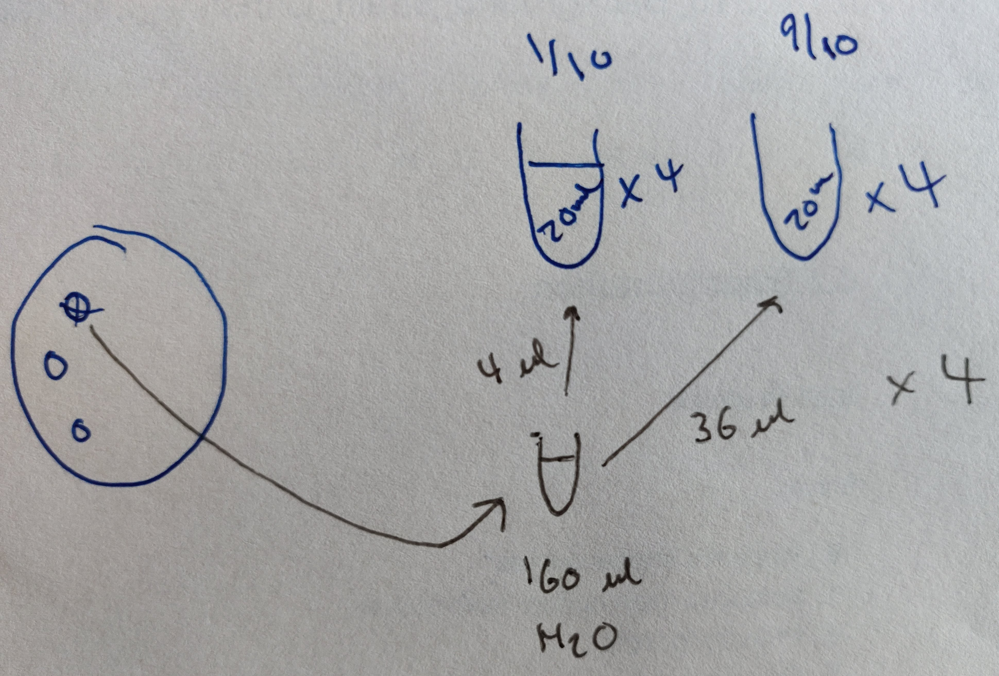

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/Data/Bioimager/2021-03-11_inoculation.jpg', width=300)

In [ ]:
#Protocol for transformation:
IPython.display.FileLink('../references/methods.ipynb')

/references/methods.ipynb

Transformations
- Strains
    - MIA-HA-(2-17)
- Controls:
    - positive (colonies should appear)
        1. No parts and directly on YPD (to check cell viability)
        2. URA and TRP plasmid on SD-URA-TRP (to check transformed markers match selection media)
    - negative (colonies should not appear)
        1. transform cells with gRNA + TRP plasmid (to check whether gRNA cuts and thus kill cells when they miss repair template)

pL_01_C4_(pRS416-URA) - ura plasmid
- 40 ul
- 600 ng/ul
vi laver egen batch:200 ng/ul af 10 ul.

pL_01_C2_(pRS414-TRP) - trp plasmid
- volumen: 30 
- concentration: 190

Remember to dilute ura plasmid to 200 ng/ul. 

In [ ]:
(200*10)/600

3.3333333333333335

3.3 ul pL_01_C4_(pRS416-URA) and 6.7 up water. 

In [ ]:
#2. import plasmids need for controls

#2. import plasmids need for controls - TRP
TRP_plasmid = SeqIO.read("/content/ConStrain_on_google_colab/Data/Plasmids/TRP_POS_CONTROL_test.gb", "gb")
TRP_plasmid.name = 'pL_01_C2_(pRS414-TRP)'
TRP_plasmid.annotations['batches']=[{'location':'pL_01_C2', 'volume':30, 'concentration':190 }]


### URA
URA_plasmid = SeqIO.read("/content/ConStrain_on_google_colab/Data/Plasmids/URA_POS_CONTROL_test.gb", "gb")
URA_plasmid.name = 'pL_01_C4_(pRS416-URA)'
URA_plasmid.annotations['batches']=[{'location':'pL_01_C4', 'volume':20, 'concentration':600 }] # Lav egen batch Actual {'location':'pL_01_C4', 'volume':40, 'concentration':600 }


/usr/local/lib/python3.7/dist-packages/Bio/GenBank/__init__.py:364: BiopythonParserWarning: Attempting to fix invalid location '3339..3288' as it looks like incorrect origin wrapping. Please fix input file, this could have unintended behavior.
  BiopythonParserWarning,


Reaction names

In [ ]:
reaction_names = assembly_names_short + ['n.ctr','p.ctr','p.ctr']

Reaction participants

In [ ]:
reaction_participants = []
for row in flat_cro_combinations_matrix:
    temp = []
    for ele in row:
        temp.append(ele)
    temp.append(pgRNA)
    reaction_participants.append(temp)

In [ ]:
reaction_participants.append([pgRNA, TRP_plasmid]) # n.ctr
reaction_participants.append([URA_plasmid, TRP_plasmid]) #p.ctr
reaction_participants.append([])  #p.ctr

Wanted amounts of reaction participants
- Parts:
    - 0.5 pmol = 0.0005 nmol
- Plasmid:
    - 500 ng pESC-URA-gRNA_XI2-2
    - 40 ng TRP and URA

In [ ]:
#Construct dict with reaction name as keys and wanted amounts as values
cro_amplicons =  cro_UP_sites +cro_G8H_sites +cro_pG8H_sites+cro_pCPR_sites+cro_CPR_sites+cro_marker_sites+cro_DW_sites    
cro_amplicon_names = [amp.name for amp in cro_amplicons]
part_amounts_per_reaction = dict(zip(cro_amplicon_names,[0.0005]*len(cro_amplicon_names)))

#The parts CPR_PCR_01,11,21 are relatively large parts and was purified in low concentration. The wanted amounts of these parts are lowered in order not to distort the reagent concentrations in the transformation mix (DNA + water cannot take more than 74 µl when to not lower the concentration of cells, PEG, LiAc, and ssDNA) 
part_amounts_per_reaction['PCR_CPR_01'] = 0.00025
part_amounts_per_reaction['PCR_CPR_11'] = 0.00025
part_amounts_per_reaction['PCR_CPR_21'] = 0.00035
part_amounts_per_reaction['PCR_CPR_31'] = 0.00045

# plasmid participants are typically given in ng....
nmol_gRNA = ng_to_nmol(ng = 500, bp = len(pgRNA))
nmol_pctr_TRP = ng_to_nmol(ng = 40, bp = len(TRP_plasmid))
nmol_pctr_URA = ng_to_nmol(ng = 40, bp = len(URA_plasmid))

# in nmol
wanted_amounts = {'pESC-URA-gRNA_XI2-2'  : nmol_gRNA,
                         'pL_01_C2_(pRS414-TRP)': nmol_pctr_TRP,
                         'pL_01_C4_(pRS416-URA)': nmol_pctr_URA,
                          **part_amounts_per_reaction}

In [ ]:
print(nmol_pctr_TRP)
print(nmol_pctr_URA)

6.994596674069282e-06
8.995535965277232e-06


In [ ]:
media = ['SC-UT'] * 18 + ['YPD']

Location neccesary parts. Bring out before and place afterwards

In [ ]:
for amp in cro_amplicons + [pgRNA] + [URA_plasmid, TRP_plasmid]:
    print(amp.name, amp.annotations['batches'][0]['location'])

PCR_UP_tADH1_01 l5_I08
PCR_G8H_21 l5_C05
PCR_G8H_22 l5_C06
PCR_G8H_23 l5_C07
PCR_G8H_24 l5_C08
PCR_PRO_01 l4_C07
PCR_PRO_06 l4_D03
PCR_PRO_07 l4_D04
PCR_PRO_08 l4_D05
PCR_PRO_05 l4_D02
PCR_PRO_04 l4_D01
PCR_PRO_03 l4_C09
PCR_PRO_02 l4_C08
PCR_CPR_01 l5_E03
PCR_CPR_11 l5_E04
PCR_CPR_21 l5_E05
PCR_CPR_31 l5_E06
PCR_TRP1-DW_01 l5_I07
PCR_TRP1-DW_02 l5_I09
pESC-URA-gRNA_XI2-2 PL_12_I6
pL_01_C4_(pRS416-URA) pL_01_C4
pL_01_C2_(pRS414-TRP) pL_01_C2


In [ ]:
pd.set_option('display.max_columns', None)  # or 1000
pd.set_option('display.max_rows', None)  # or 1000
pd.set_option('display.max_colwidth', None) 
transformation_mix(reaction_names, reaction_participants, wanted_amounts = wanted_amounts, water_dna_p_reac = 74, media = media)

,name,PCR_UP_tADH1_01,PCR_G8H_21,PCR_PRO_01,PCR_PRO_05,PCR_CPR_01,PCR_TRP1-DW_01,PCR_TRP1-DW_02,pESC-URA-gRNA_XI2-2,PCR_PRO_04,PCR_CPR_11,PCR_PRO_03,PCR_CPR_21,PCR_PRO_02,PCR_CPR_31,PCR_G8H_22,PCR_PRO_06,PCR_G8H_23,PCR_PRO_07,PCR_G8H_24,PCR_PRO_08,pL_01_C2_(pRS414-TRP),pL_01_C4_(pRS416-URA),water,plate on
0,HA2,6.6,12.5,3.4,2.8,25.6,3.0,4.9,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.2,SC-UT
1,HA3,6.6,12.5,3.4,NaN,NaN,3.0,4.9,2.0,3.8,25.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.2,SC-UT
2,HA4,6.6,12.5,3.4,NaN,NaN,3.0,4.9,2.0,NaN,NaN,3.4,26.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.3,SC-UT
3,HA5,6.6,12.5,3.4,NaN,NaN,3.0,4.9,2.0,NaN,NaN,NaN,NaN,3.3,23.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.3,SC-UT
4,HA6,6.6,NaN,NaN,2.8,25.6,3.0,4.9,2.0,NaN,NaN,NaN,NaN,NaN,NaN,11.3,3.1,NaN,NaN,NaN,NaN,NaN,NaN,14.7,SC-UT
5,HA7,6.6,NaN,NaN,NaN,NaN,3.0,4.9,2.0,3.8,25.6,NaN,NaN,NaN,NaN,11.3,3.1,NaN,NaN,NaN,NaN,NaN,NaN,13.7,SC-UT
6,HA8,6.6,NaN,NaN,NaN,NaN,3.0,4.9,2.0,NaN,NaN,3.4,26.9,NaN,NaN,11.3,3.1,NaN,NaN,NaN,NaN,NaN,NaN,12.8,SC-UT
7,HA9,6.6,NaN,NaN,NaN,NaN,3.0,4.9,2.0,NaN,NaN,NaN,NaN,3.3,23.0,11.3,3.1,NaN,NaN,NaN,NaN,NaN,NaN,16.8,SC-UT
8,HA10,6.6,NaN,NaN,2.8,25.6,3.0,4.9,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.8,4.5,NaN,NaN,NaN,NaN,5.8,SC-UT
9,HA11,6.6,NaN,NaN,NaN,NaN,3.0,4.9,2.0,3.8,25.6,NaN,NaN,NaN,NaN,NaN,NaN,18.8,4.5,NaN,NaN,NaN,NaN,4.8,SC-UT


### Notes: 
- CPR_01, CPR_11 and CPR_21: 25 ul was added instead of ~30. (there might have been added a bit to much/too little water)
- CPR_31: 25 ul added to 3 an 7. 7 ul added to 11 and 15. 
- Plate for 16 (negative control) was very wet. 
- Plates incubated ~16 o'clock 12/3

In [ ]:
pd.reset_option('all')

As the xlwt package is no longer maintained, the xlwt engine will be removed in a future version of pandas. This is the only engine in pandas that supports writing in the xls format. Install openpyxl and write to an xlsx file instead.

: boolean
    use_inf_as_null had been deprecated and will be removed in a future
    version. Use `use_inf_as_na` instead.



/usr/local/lib/python3.7/dist-packages/pandas/_config/config.py:630: FutureWarning: As the xlwt package is no longer maintained, the xlwt engine will be removed in a future version of pandas. This is the only engine in pandas that supports writing in the xls format. Install openpyxl and write to an xlsx file instead.
  warnings.warn(d.msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/pandas/_config/config.py:630: FutureWarning: 
: boolean
    use_inf_as_null had been deprecated and will be removed in a future
    version. Use `use_inf_as_na` instead.

  warnings.warn(d.msg, FutureWarning)


In [ ]:
pcr_volumes(vol_p_reac = 360, 
        no_of_reactions = 20,
        standard_reagents = ["PEG", "LiAc_1M", "ssDNA", "water_dna"],
        standard_volumes = [240, 36, 10, 74])

,vol_p_reac,vol_p_20_reac
PEG,240.0,4800.0
LiAc_1M,36.0,720.0
ssDNA,10.0,200.0
water_dna,74.0,1480.0
Total,360.0,7200.0


In [ ]:
#print_full(transformation_mix)

Expectation:

- plate 0-15 should be as plate one. 
- plate 16 == 2,3 or 4
- plate 17 and 18 like 5. 

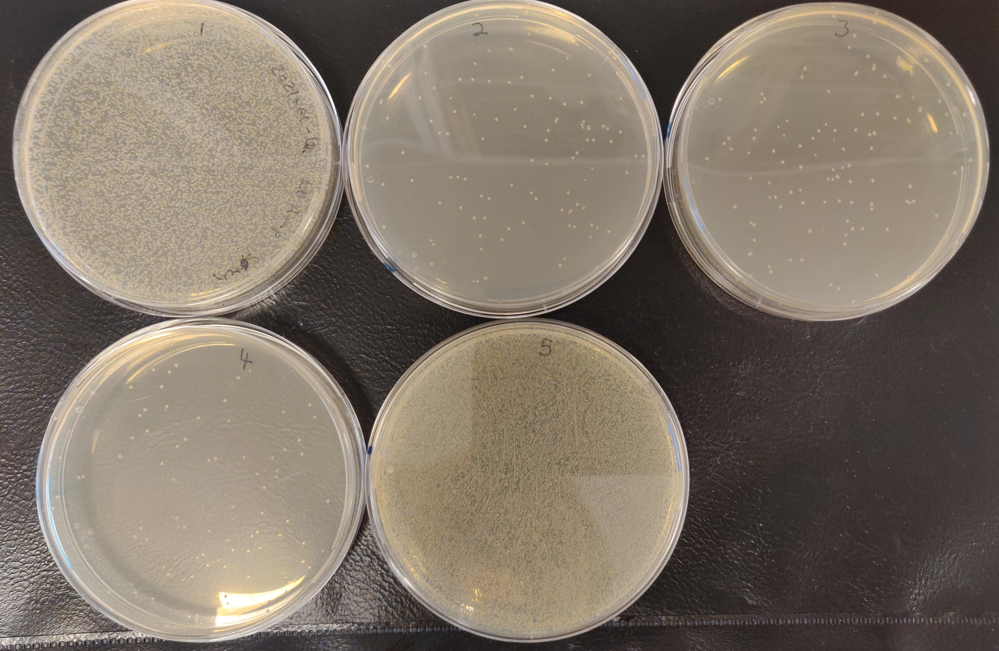

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/Data/Bioimager/dgRNA ATF1 and CroCPR.jpg', width=600)

Actual

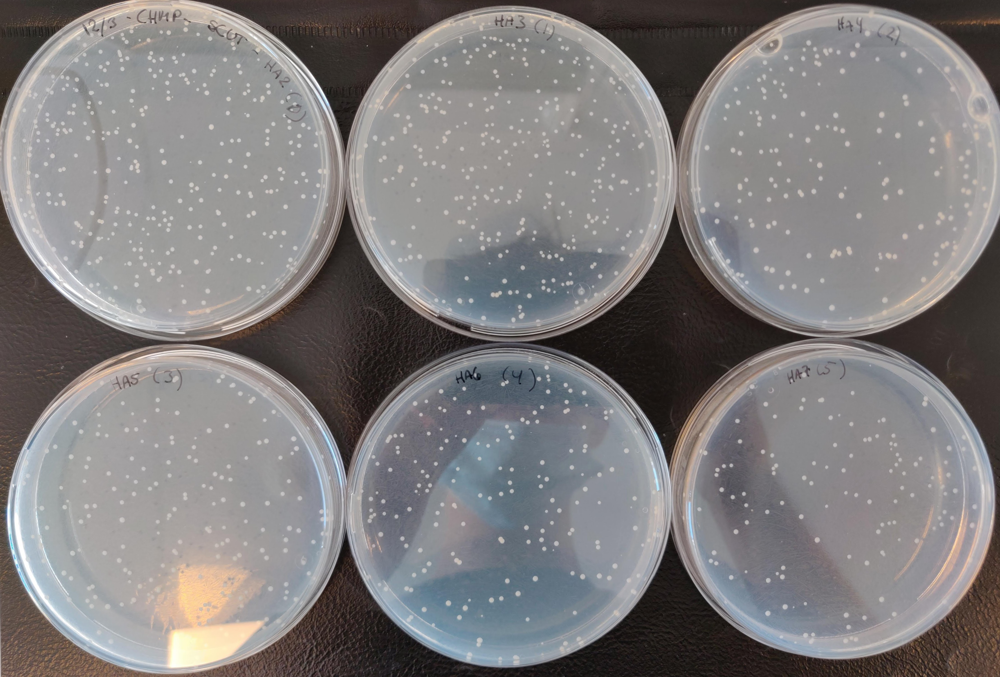

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/Data/Bioimager/2021-03-16_transformation_plates_0-5.jpg', width=600)

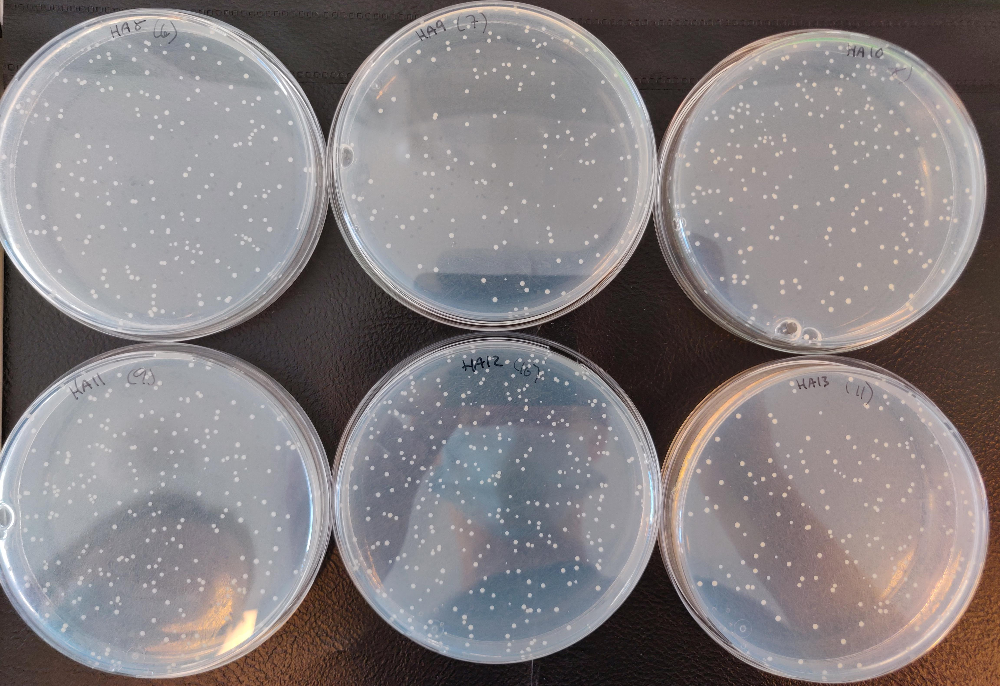

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/Data/Bioimager/2021-03-16_transformation_plates_6-11.jpg', width=600)

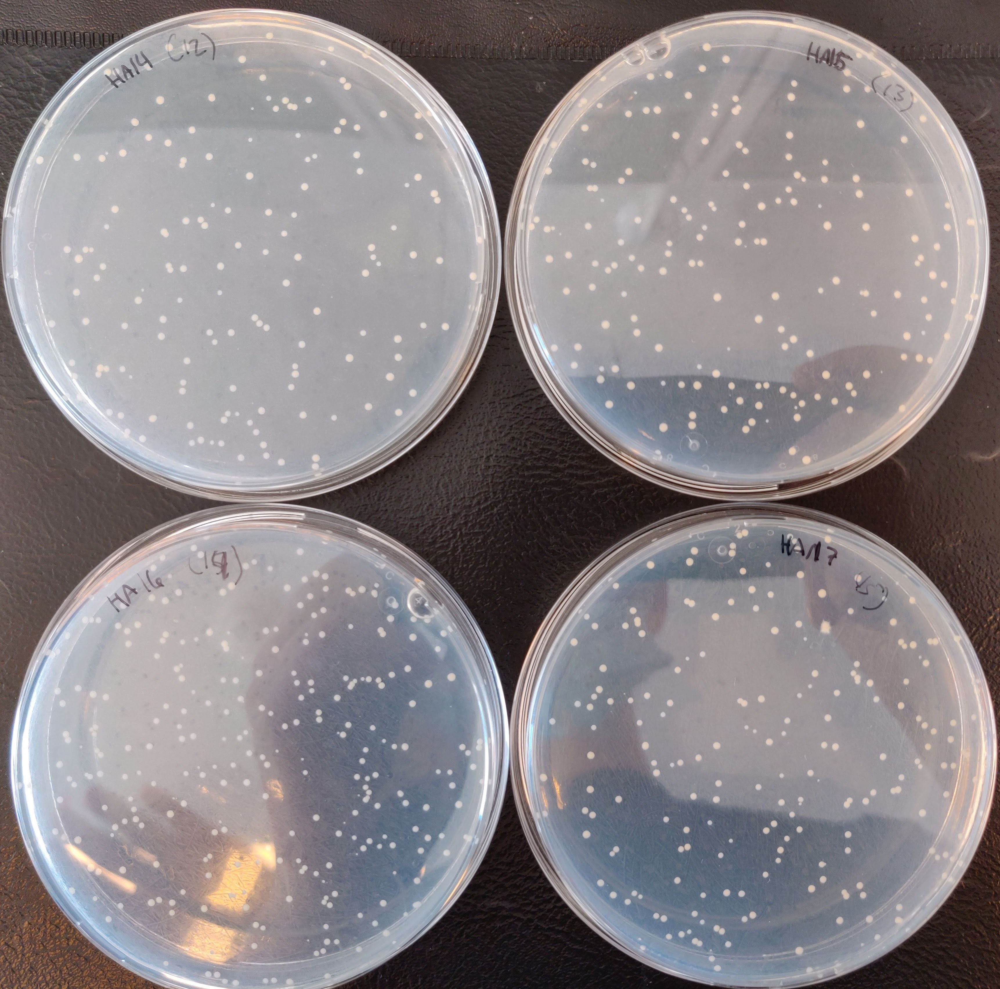

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/Data/Bioimager/2021-03-16_transformation_plates_12-15.jpg', width=400)

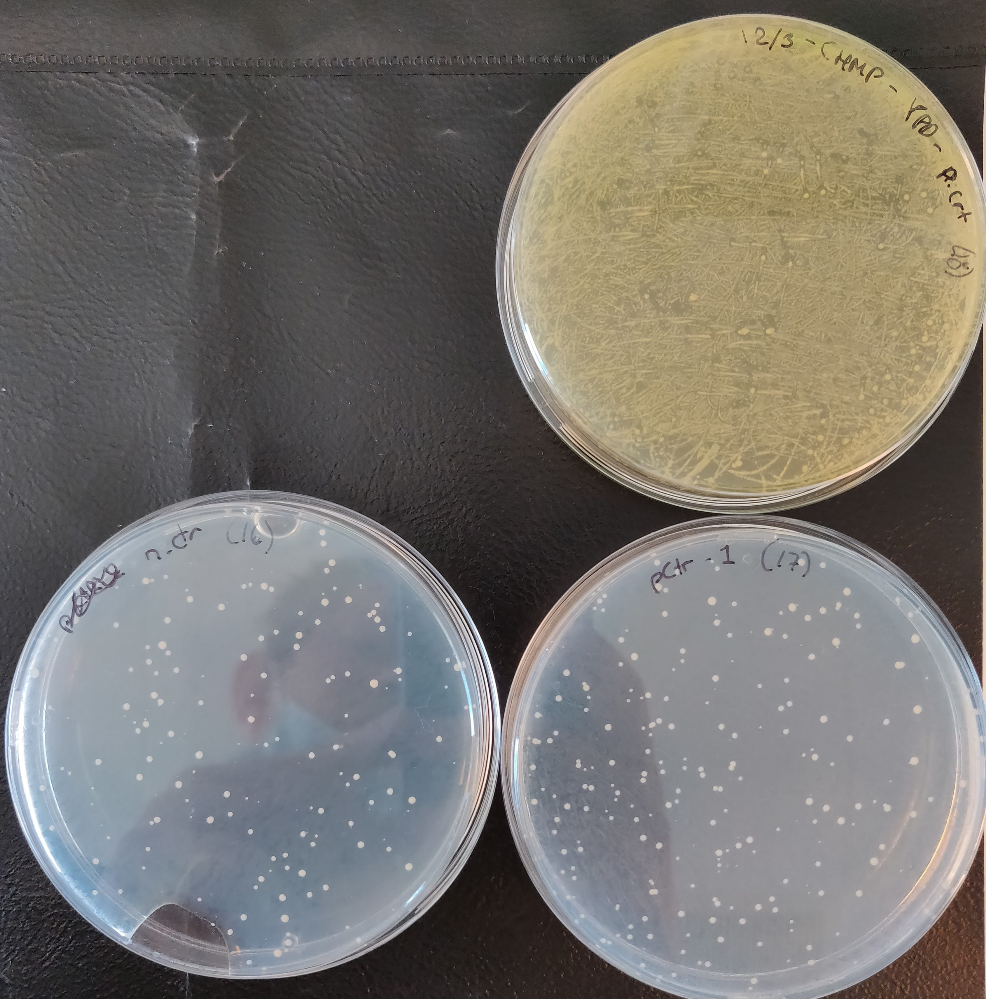

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/Data/Bioimager/2021-03-16_transformation_plates_16-18.jpg', width=400)

### Observations
- plate 0-15: Same amount as posistive control. See explanation below.
- plate 16: n.ctr: high cell number than expected, however the cells might have performed non homologous end joining and this is expected. 
- plate 17: p. ctr. Low amount of cell compared to expected. Checked tryptophan and uracil markers on plasmids, and they match the markers used for the mutants. Possible explanation for low growth is the low molar amount added of each plasmid compared to the parts (see below). As the positive control usually has higher chances for survival but here had less markers to be taken up by the cells compared to mutants, it makes sense that mutants and p.ctr have similar cell numbers. Take away message is to add the same molar amount of plasmids as of each part for insertion. 
- plate 18: high amount of cells as expected. Cells survived transformation preparation.


In [ ]:
print("Nmol added:")
for amt in part_amounts_per_reaction.items():
    print(amt[0], amt[1])
print('pESC-URA-gRNA_XI2-2 '+str(nmol_gRNA))
print('pL_01_C2_(pRS414-TRP) '+str(nmol_pctr_TRP))
print('pL_01_C4_(pRS416-URA) '+str(nmol_pctr_URA))

Nmol added:
PCR_UP_tADH1_01 0.0005
PCR_G8H_21 0.0005
PCR_G8H_22 0.0005
PCR_G8H_23 0.0005
PCR_G8H_24 0.0005
PCR_PRO_01 0.0005
PCR_PRO_06 0.0005
PCR_PRO_07 0.0005
PCR_PRO_08 0.0005
PCR_PRO_05 0.0005
PCR_PRO_04 0.0005
PCR_PRO_03 0.0005
PCR_PRO_02 0.0005
PCR_CPR_01 0.00025
PCR_CPR_11 0.00025
PCR_CPR_21 0.00035
PCR_CPR_31 0.00045
PCR_TRP1-DW_01 0.0005
PCR_TRP1-DW_02 0.0005
pESC-URA-gRNA_XI2-2 0.00028002576237013804
pL_01_C2_(pRS414-TRP) 6.994596674069282e-06
pL_01_C4_(pRS416-URA) 8.995535965277232e-06


Store colonies:
- Pick 3 colonies from plates nos 0-15 (cro plates) as well as from plate no. 16 (p. ctr).
- make glycerol stock
- use rest for HT DNA extraction and genotyping (see below)
Create  plate in benchling with:
- create 96 well plate yp48 at -80 rack Y18
- create batches
- add batches to containers in yp48
- create spreasheet for bulk upload
    - Would be great to be aple to specify containter information when importing batches

In [ ]:
cro_batch_entity_names = [ele for ele in assembly_names for i in range(3)]
cro_batch_entity_names = cro_batch_entity_names + ['MIA-HA-1'] * 3 + ['MIA-HA-17'] * 3

In [ ]:
cro_batch_entity_names

['MIA-HA-2',
 'MIA-HA-2',
 'MIA-HA-2',
 'MIA-HA-3',
 'MIA-HA-3',
 'MIA-HA-3',
 'MIA-HA-4',
 'MIA-HA-4',
 'MIA-HA-4',
 'MIA-HA-5',
 'MIA-HA-5',
 'MIA-HA-5',
 'MIA-HA-6',
 'MIA-HA-6',
 'MIA-HA-6',
 'MIA-HA-7',
 'MIA-HA-7',
 'MIA-HA-7',
 'MIA-HA-8',
 'MIA-HA-8',
 'MIA-HA-8',
 'MIA-HA-9',
 'MIA-HA-9',
 'MIA-HA-9',
 'MIA-HA-10',
 'MIA-HA-10',
 'MIA-HA-10',
 'MIA-HA-11',
 'MIA-HA-11',
 'MIA-HA-11',
 'MIA-HA-12',
 'MIA-HA-12',
 'MIA-HA-12',
 'MIA-HA-13',
 'MIA-HA-13',
 'MIA-HA-13',
 'MIA-HA-14',
 'MIA-HA-14',
 'MIA-HA-14',
 'MIA-HA-15',
 'MIA-HA-15',
 'MIA-HA-15',
 'MIA-HA-16',
 'MIA-HA-16',
 'MIA-HA-16',
 'MIA-HA-17',
 'MIA-HA-17',
 'MIA-HA-17',
 'MIA-HA-1',
 'MIA-HA-1',
 'MIA-HA-1',
 'MIA-HA-17',
 'MIA-HA-17',
 'MIA-HA-17']

In [ ]:
cro_strain_batches = pd.DataFrame.from_dict({
'names' : cro_batch_entity_names,
'Type': ['Glycerol stock'] * len(cro_batch_entity_names),
'Date stored': ['16-03-2021'] * len(cro_batch_entity_names),
'Stored By': ['Soeren Petersen'] * len(cro_batch_entity_names),
#'Strain':   ['','','','','','','','','','','','',
#                   '','MIA-HA-2','MIA-HA-2','MIA-HA-2','MIA-HA-3','MIA-HA-3','MIA-HA-3','MIA-HA-4','MIA-HA-4','MIA-HA-4','MIA-HA-5','',
#                   '','MIA-HA-5','MIA-HA-5','MIA-HA-6','MIA-HA-6','MIA-HA-6','MIA-HA-7','MIA-HA-7','MIA-HA-7','MIA-HA-8','MIA-HA-8','',
#                   '','MIA-HA-8','MIA-HA-9','MIA-HA-9','MIA-HA-9','MIA-HA-10','MIA-HA-10','MIA-HA-10','MIA-HA-11','MIA-HA-11','MIA-HA-11','',
#                   '','MIA-HA-12','MIA-HA-12','MIA-HA-12','MIA-HA-13','MIA-HA-13','MIA-HA-13','MIA-HA-14','MIA-HA-14','MIA-HA-14','MIA-HA-15','',
#                   '','MIA-HA-15','MIA-HA-15','MIA-HA-16','MIA-HA-16','MIA-HA-16','MIA-HA-17','MIA-HA-17','MIA-HA-17','MIA-HA-1','MIA-HA-1','',
#                   '','MIA-HA-1','','','','','MIA-HA-17','MIA-HA-17','MIA-HA-17','','','',
#                   '','','','','','','','','','','',''],
#'Replicate #': ['','','','','','','','','','','','',
#                   '','1','2','3','1','2','3','1','2','3','1','',
#                   '','2','3','1','2','3','1','2','3','1','2','',
#                   '','3','1','2','3','1','2','3','1','2','3','',
#                   '','1','2','3','1','2','3','1','2','3','1','',
#                   '','2','3','1','2','3','1','1','2','3','4','',
#                   '','5','','','','','6','7','8','','','',
#                   '','','','','','','','','','','',''],
#'Plate barcode' : ['96WP1002'] * len(cro_batch_entity_names),
#'position'    :   ['A1','A2','A3','A4','A5','A6','A7','A8','A9','A10','A11','A12',
#                   'B1','B2','B3','B4','B5','B6','B7','B8','B9','B10','B11','B12',
#                   'C1','C2','C3','C4','C5','C6','C7','C8','C9','C10','C11','C12',
#                   'D1','D2','D3','D4','D5','D6','D7','D8','D9','D10','D11','D12',
#                   'E1','E2','E3','E4','E5','E6','E7','E8','E9','E10','E11','E12',
#                   'F1','F2','F3','F4','F5','F6','F7','F8','F9','F10','F11','F12',
#                   'G1','G2','G3','G4','G5','G6','G7','G8','G9','G10','G11','G12',
#                   'H1','H2','H3','H4','H5','H6','H7','H8','H9','H10','H11','H12'],
#'volume' : [150] * len(cro_batch_entity_names),
#'volume unit' : ['ul'] * len(cro_batch_entity_names),
}
)
cro_strain_batches.head()

,names,Type,Date stored,Stored By
0,MIA-HA-2,Glycerol stock,16-03-2021,Soeren Petersen
1,MIA-HA-2,Glycerol stock,16-03-2021,Soeren Petersen
2,MIA-HA-2,Glycerol stock,16-03-2021,Soeren Petersen
3,MIA-HA-3,Glycerol stock,16-03-2021,Soeren Petersen
4,MIA-HA-3,Glycerol stock,16-03-2021,Soeren Petersen


Bulk upload to benchling

# Genotyping 

1. Design and order primers
2. Simulate
3. Genotype
    - HT yeast dna extraction protocol of YP48
    - Colony PCR
6. Glycerol stock

## Design primers

Primers
1. Design
2. Upload (name, sequence, register)
3. Order and receive
    - when arrived
        - retrive primer (physically)
        - find box with available position (algorithmically)
        - create container and batch (for both 10 and 100 µM stock) (algorithmically)
        - dilute, label and place (physically)
4. Download for simulation

In [ ]:
#1. Design (Add code)

# 1. Strategy. Easier (shorter bands)
#XI-2-sq-fw #909
#XI-2-sq-rv #910
#JM234_ColoPCR_vec_TADH1_towards out #2221
#tTRP1_60_Fw
# If integration:
# - failed: XI-2-sq-fw and XI-2-sq-rv produces ~ 1.6 kb
# - succesfull: XI-2-sq-fw + tADH1_fw ~ 0.9 kb
#               XI_2_sq_rv + tTRP1_60_Fw ~ 1 kb

# 2. Strategy. More difficult (longer bands)
#ADH1_test_fw #224
#CYC1_test_rv #225
#pad_pG8H_fw
#pad_pCPR_fw
# If integration:
# - succesfull: tADH1_160_rv + pad_pG8H_fw ~2.5 kb
#               tCYC1_150_rv + tTRP1_60_Fw ~3.2 kb
# allows sequencing of pG8H, G8H, pCPR, CPR parts

In [ ]:
#2. Upload
#utils.sequence_to_benchling("ssDNA", "tTRP1_60_Fw", "ACCGCACAGATGCGTAAG", "Primer")
#utils.sequence_to_benchling("ssDNA", "pad_pG8H_fw", "TGCCCATTCGATAAGGCA", "Primer")
#utils.sequence_to_benchling("ssDNA", "pad_pCPR_fw", "GGCGTATGGACCTGTCT", "Primer")

#3. Order and receive (Add code)
- Create .csv for upload
- selenium open idt.com order page

In [ ]:
# 1. Strategy
XI_2_sq_fw = SeqIO.read("/content/ConStrain_on_google_colab/Data/Primers/XI_2_sq_fw.fasta", "fasta")
XI_2_sq_rv = SeqIO.read("/content/ConStrain_on_google_colab/Data/Primers/XI_2_sq_rv.fasta", "fasta")
tADH1_fw = SeqIO.read("/content/ConStrain_on_google_colab/Data/Primers/tADH1_fw.fasta", "fasta")
tTRP1_60_Fw = SeqIO.read("/content/ConStrain_on_google_colab/Data/Primers/tTRP1_60_Fw.fasta", "fasta")

# 2. Strategy
tADH1_160_rv = SeqIO.read("/content/ConStrain_on_google_colab/Data/Primers/tADH1_160_rv.fasta", "fasta")
tCYC1_150_rv = SeqIO.read("/content/ConStrain_on_google_colab/Data/Primers/tCYC1_150_rv.fasta", "fasta")
pad_pG8H_fw = SeqIO.read("/content/ConStrain_on_google_colab/Data/Primers/pad_pG8H_fw.fasta", "fasta")
pad_pCPR_fw = SeqIO.read("/content/ConStrain_on_google_colab/Data/Primers/pad_pCPR_fw.fasta", "fasta")



In [ ]:
XI_2_sq_fw.annotations['batches'] = [{'location'    :'p1_a4',
                                 'volume'       : 170,
                                 'concentration': 234}]
XI_2_sq_rv.annotations['batches'] = [{'location'    :'p1_a4',
                                 'volume'       : 170,
                                 'concentration': 234}]

In [ ]:
print(XI_2_sq_fw.seq)
print(XI_2_sq_rv.seq)
print()
print()

GTTTGTAGTTGGCGGTGGAG
GAGACAAGATGGGGCAAGAC




In [ ]:
# HA1 site
checking_site = SeqIO.read("/content/ConStrain_on_google_colab/Data/Strain_sequences/HA1.gb", "gb")


In [ ]:
#Save the insertion site
HA1.annotations['location'] = "unknown"
#checking_site = extract_sites(["XI-2"], [HA1],["XI-2"])[0]

In [ ]:
checking_site

SeqRecord(seq=Seq('TGACGAATCGTTAGGCACAGTTATATAGTTATATACACATAGACATACATATGT...CTC'), id='<unknown id>', name='MIA-HA-1', description='', dbxrefs=[])

In [ ]:
'''for assem in assemblies:
    print(assem.name)'''

'for assem in assemblies:\n    print(assem.name)'

In [ ]:
list_of_primers = [XI_2_sq_fw, XI_2_sq_rv, tADH1_fw, tTRP1_60_Fw]
list_of_primers

[SeqRecord(seq=Seq('GTTTGTAGTTGGCGGTGGAG'), id='seq_f0DxM4nU', name='seq_f0DxM4nU', description='seq_f0DxM4nU <unknown description>', dbxrefs=[]),
 SeqRecord(seq=Seq('GAGACAAGATGGGGCAAGAC'), id='seq_8At1dmPw', name='seq_8At1dmPw', description='seq_8At1dmPw <unknown description>', dbxrefs=[]),
 SeqRecord(seq=Seq('GTTGACACTTCTAAATAAGCGAATTTC'), id='seq_CQBEbYLQ', name='seq_CQBEbYLQ', description='seq_CQBEbYLQ <unknown description>', dbxrefs=[]),
 SeqRecord(seq=Seq('ACCGCACAGATGCGTAAG'), id='seq_YLTR2B9y', name='seq_YLTR2B9y', description='seq_YLTR2B9y <unknown description>', dbxrefs=[])]

In [ ]:
#save primers
list_of_primers = [XI_2_sq_fw, XI_2_sq_rv, tADH1_fw, tTRP1_60_Fw]
list_of_UP_primers = [XI_2_sq_fw, tADH1_fw]
list_of_DW_primers = [XI_2_sq_rv, tTRP1_60_Fw]
list_of_UP_amplifications = []
list_of_DW_amplifications = []

#save pcr amplicon
for i in range(len(assemblies)):
    list_of_UP_amplifications.append(pydna.amplify.pcr(list_of_UP_primers[0], list_of_UP_primers[1], assemblies[i]))
    list_of_UP_amplifications.append(pydna.amplify.pcr(list_of_UP_primers[0], list_of_UP_primers[1], assemblies[i]))
    list_of_UP_amplifications.append(pydna.amplify.pcr(list_of_UP_primers[0], list_of_UP_primers[1], assemblies[i]))
    list_of_DW_amplifications.append(pydna.amplify.pcr(list_of_DW_primers[0], list_of_DW_primers[1], assemblies[i]))

for i in range(0,3):
    list_of_UP_amplifications.append(pydna.amplify.pcr(list_of_UP_primers[0], list_of_DW_primers[0], checking_site))

#Save colony names and add it to pcr description
col_nos   = [1,2,3,1,2,3,1,2,3,1,2,3,1,2,3,1,2,3,1,2,3,1,2,3,1,2,3,1,2,3,1,2,3,1,2,3,1,2,3,1,2,3,1,2,3,1,2,3,1,2,3]
plate_nos = [0,0,0,1,1,1,2,2,2,3,3,3,4,4,4,5,5,5,6,6,6,7,7,7,8,8,8,9,9,9,10,10,10,11,11,11,12,12,12,13,13,13,14,14,14,15,15,15,17,17,17]
templates = [str(p_no) + "_" + str(c_no) for p_no, c_no in zip(plate_nos,col_nos)]
    
description = []
for assem in assemblies:
    description.append(assem.name)
    description.append(assem.name)
    description.append(assem.name)
    
for i in range(0,3):
    description.append("MIA-HA-1")
 

NameError: ignored

In [ ]:
list_of_UP_amplifications

In [ ]:
for amplicon in amplicons:
    print(amplicon.name, "\t", amplicon.annotations['batches'][0]['location'])

In [ ]:
XI_2_sq_fw.annotations['batches']

In [ ]:
#add necessary information
for i in range(0,len(list_of_UP_amplifications)):
    list_of_UP_amplifications[i].name = templates[i]
    #list_of_UP_amplifications[i].annotations['batches'] = [{'location':str(XI_2_sq_fw.annotations['batches']['location'])+' '+str(XI_2_sq_rv.annotations['batches'][0]['location'])+' '+str(tADH1_fw.annotations['batches'][0]['location'])}]
    list_of_UP_amplifications[i].annotations['template_location'] = templates[i]
    list_of_UP_amplifications[i].annotations['template_name'] = "plate_col: "+str(templates[i])

In [ ]:
for i in range(len(list_of_UP_amplifications)):
    print(list_of_UP_amplifications[i].name)

In [ ]:
#str(XI_2_sq_fw.annotations['batches'][0]['location'])+' '+str(XI_2_sq_rv.annotations['batches'][0]['location'])+' '+str(tADH1_fw.annotations['batches'][0]['location'])+' '+str(tTRP1_60_Fw.annotations['batches'][0]['location'])

In [ ]:
plate_locations_CPCR = []
for amplicon in list_of_UP_amplifications:
    plate_locations_CPCR.append([amplicon.name, 
                            amplicon.annotations['batches'][0]['location'],
                            amplicon.annotations['template_name'],
                            #amplicon.template.annotations['batches'][0]['location'],
                            amplicon.forward_primer.id,
                            amplicon.forward_primer.annotations['batches'][0]['location'],
                            amplicon.reverse_primer.id,
                            amplicon.reverse_primer.annotations['batches'][0]['location']
                           ])
list_of_UP_amplifications_df = pd.DataFrame(plate_locations_CPCR, columns=['name', 'location','template_name','fw_name','fw_location','rv_name','rv_location'])
list_of_UP_amplifications_df = list_of_UP_amplifications_df.set_index('name')

map_name_plocation = pd.read_csv("/content/ConStrain_on_google_colab/Data/CroG8H_CPR_PCR_location.csv").set_index('name') #mapping: PCR plate location to PCR name
map_name_plocation = map_name_plocation.loc[~map_name_plocation.index.duplicated(keep='first')]
list_of_UP_amplifications_df = list_of_UP_amplifications_df.loc[~list_of_UP_amplifications_df.duplicated(keep='first')]
list_of_UP_amplifications_df = pd.concat([list_of_UP_amplifications_df, map_name_plocation], axis=1, join="outer")
list_of_UP_amplifications_df.index.names = ['name']
list_of_UP_amplifications_df = list_of_UP_amplifications_df.reset_index()
#list_of_UP_amplifications_df = list_of_UP_amplifications_df.sort_values(by=['prow', 'pcol'])
list_of_UP_amplifications_df.head()

In [ ]:
plate_plot(list_of_UP_amplifications_df, 'name')

In [ ]:
#For easier illustration: 
#All mutants should have the same length in genotyping
illustration_ampl = []
illustration_ampl.append(pydna.amplify.pcr(list_of_primers[0], list_of_primers[2], assemblies[0]))
illustration_ampl.append(pydna.amplify.pcr(list_of_primers[0], list_of_primers[1], checking_site))
illustration_ampl.append(pydna.amplify.pcr(list_of_primers[0], list_of_primers[1], checking_site))


#Save names
description = []
description.append("HA2-17 Upstream check")
description.append("HA1 negative control")
description.append("HA1 purification control")

#
templates = ["0-16_1-3", "17_1-2", "p.ctr."]

for band, desc, temp in zip(illustration_ampl, description, templates):
    band.name = desc + "-" + temp
    band.annotations['batches'] = [{'location':str(XI_2_sq_fw.annotations['batches'][0]['location'])+' '+str(XI_2_sq_rv.annotations['batches'][0]['location'])+' '+str(tADH1_fw.annotations['batches'][0]['location'])}]
    band.annotations['template_location'] = temp

In [ ]:
#Further development: make a water control incorporated.

In [ ]:
#str(XI_2_sq_fw.annotations['batches'][0]['location'])+' '+str(XI_2_sq_rv.annotations['batches'][0]['location'])+' '+str(tADH1_fw.annotations['batches'][0]['location'])+' '+str(tTRP1_60_Fw.annotations['batches'][0]['location'])

In [ ]:
pcr_locations(illustration_ampl)

In [ ]:
3*16+3+1+2-20

Husk vand!

In [ ]:
pcr_volumes(vol_p_reac = 25, 
        no_of_reactions = 35,
        standard_reagents = ["Template", "Primer 1", "Primer 2", "Primer 3", "H20", "Pol"],
        standard_volumes = [1, 2.5, 2.5, 2.5, 16.5, 25])

In [ ]:
XI_2_sq_fw.seq, XI_2_sq_rv.seq, tADH1_fw.seq

PCR:
- polymerase: oneTaq (1min / kb)
- Program: touch down (53/47)
- Annealing temp: 50/55
- Elongation time: 1min 35 sek (1573b)


tADH1_fw: TM 55
rest TM: 60

In [ ]:
#illustration_ampl[1].program()

In [ ]:
for band in  illustration_ampl:
    print(band.name)
pydna.gel.gel([pydna.ladders.PennStateLadder,*[[band] for band in illustration_ampl]])

#### Colony PCR result

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/Data/Bioimager/2021-03-19_ColonyPCR_0-15_jpg.jpg', width=400)

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/Data/Bioimager/2021-03-19_ColonyPCR_17_P_N_jpg.jpg', width=400)

Notes: all transformations were successfull. Negative controls confirmed that. 


Make a function that

### Second strategy

In [ ]:
#Second design
list_of_primers_2 = [pad_pG8H_fw, pad_pCPR_fw, tADH1_160_rv, tCYC1_150_rv]

#All mutants should have the same length in genotyping
illustration_ampl_2 = []
illustration_ampl_2.append(pydna.amplify.pcr(list_of_primers_2[0], list_of_primers_2[2], assemblies[0]))
illustration_ampl_2.append(pydna.amplify.pcr(list_of_primers_2[1],list_of_primers_2[3], assemblies[0]))

#Save names
description_2 = []
description_2.append("HA2-17 Upstream check")
description_2.append("HA2-17 downstream check")

#
templates = ["0-16_1-3","0-16_1-3"]

for band2, desc, temp in zip(illustration_ampl_2, description_2, templates):
    band2.name = desc + "-" + temp
    band2.annotations['batches'] = [{'location':""}]
    band2.annotations['template_location'] = temp
    
#str(XI_2_sq_fw.annotations['batches'][0]['location'])+' '+str(XI_2_sq_rv.annotations['batches'][0]['location'])+' '+str(tADH1_fw.annotations['batches'][0]['location'])+' '+str(tTRP1_60_Fw.annotations['batches'][0]['location'])

In [ ]:
pad_pG8H_fw.footprint

In [ ]:
tADH1_160_rv.footprint

Create two PCR 96 plates. 
one for G8H and one for CPR. 

0-16+17+H20 (55)

In [ ]:
pcr_locations(illustration_ampl_2)

In [ ]:
no_of_react = 3*17+3+1

In [ ]:
pcr_volumes(vol_p_reac = 25, 
        no_of_reactions = no_of_react+4,
        standard_reagents = ["Template", "Primer 1", "Primer 2", "H20", "Pol"],
        standard_volumes = [1, 2.5, 2.5, 19, 25])

Make two pcr mixes - one for G8H and one for CPR. 

In [ ]:
illustration_ampl_2[0].name

In [ ]:
PCR_program(illustration_ampl_2[1], "OneTaq Hot Start", touch_down = True)

In [ ]:
illustration_ampl_2[0].program()

In [ ]:
#PCR_program(illustration_ampl_2[1], "OneTaq Hot Start", touch_down = True)

PCR:
run two different PCR's 
- polymerase: OneTq 60 sek/kb
- Program: 
- Annealing temp:
    - 51/48
- Elongation time: 
    - 3:12/2:32

In [ ]:
for band in  illustration_ampl_2:
    print(band.name)
pydna.gel.gel([pydna.ladders.PennStateLadder,*[[band] for band in illustration_ampl_2]])

Run two different gels for each. 17 and water is expected to be empty. 

#### Colony pcr result

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/Data/Bioimager/2021-03-22_croG8H_colony_PCR.jpg', width=800)

In [ ]:
IPython.core.display.Image('/content/ConStrain_on_google_colab/Data/Bioimager/2021-03-22_croCPR_colony_PCR.jpg', width=800)

In [ ]:
IPython.display.FileLink('../references/methods.ipynb')

# Analytics

Experiment
1. Check if MIA-HA-2 - 17 strains produces MIA's with / without feeding. We suspect that the base strain MIA-HA-1 has lost GES and or TDC (outside strictosidine module). If this is the case our strains will only produce MIA when feed

Strains  
1. YP48

Media feed: 0.2 mM geraniol & 1 mM tryptamine
1. YP + 2 % glucose 
2. YP + 2 % glucose + feed

Cultivation 30C, 300 rpm 
1. (Wednesday 24): Inoculate precultures. Transfer 10 of YP48 g.stock to 90 media 1 (-feed). 
2. (Friday 26):  Inoculate maincultures. Transfer 10 of preculture to  500 media 1 and media 2
3. (Monday 8): For each media, one at a time:
    1. Transfer 10 of mainculture into 140 to measure OD (in incubator while measuring)
    2. Transfer 200 into new 96 well plate,
    3. Add 20 uL 10 mg/L caffeine stock
    4. Add X ul Std_MM_v13 standards
    5. Transfer 220 onto filter in collection plate, centrifuge (2000 g x 1 min; put collection plate in -80C) 
    6. Measure MIAs (extracellular loganin)
4. (TBD): Khem run plate
5. (TBD): Data analysis

Create spreadsheet for sample registration in benchling: https://lims.biosustain.dtu.dk/app/sample-registration

In [ ]:
cro_strain_LIMS_registration = pd.DataFrame.from_dict({
'position'    :   ['A1','A2','A3','A4','A5','A6','A7','A8','A9','A10','A11','A12',
                   'B1','B2','B3','B4','B5','B6','B7','B8','B9','B10','B11','B12',
                   'C1','C2','C3','C4','C5','C6','C7','C8','C9','C10','C11','C12',
                   'D1','D2','D3','D4','D5','D6','D7','D8','D9','D10','D11','D12',
                   'E1','E2','E3','E4','E5','E6','E7','E8','E9','E10','E11','E12',
                   'F1','F2','F3','F4','F5','F6','F7','F8','F9','F10','F11','F12',
                   'G1','G2','G3','G4','G5','G6','G7','G8','G9','G10','G11','G12',
                   'H1','H2','H3','H4','H5','H6','H7','H8','H9','H10','H11','H12'],
'Sample name' :   ['','','','','','','','','','','','',
                   '','0_1','0_2','0_3','1_1','1_2','1_3','2_1','2_2','2_3','3_1','',
                   '','3_2','3_3','4_1','4_2','4_3','5_1','5_2','5_3','6_1','6_2','',
                   '','6_3','7_1','7_2','7_3','8_1','8_2','8_3','9_1','9_2','9_3','',
                   '','10_1','10_2','10_3','11_1','11_2','11_3','12_1','12_2','12_3','13_1','',
                   '','13_2','13_3','14_1','14_2','14_3','15_1','15_2','15_3','17_1','17_2','',
                   '','17_3','','','','','15_4','15_5','15_6','','','',
                   '','','','','','','','','','','',''],
#'std_blank_wo_IS','blank_std_1','std1','std2','std3','std4','std5','std6','std7','std8','std9','std10'],
'Cellular compartment': ['Extracellular Region'] * 96,
'Medium': ['YPD'] * 96,
'Sample Type':   ['','','','','','','','','','','','',
                   '','Specimen','Specimen','Specimen','Specimen','Specimen','Specimen','Specimen','Specimen','Specimen','Specimen','',
                   '','Specimen','Specimen','Specimen','Specimen','Specimen','Specimen','Specimen','Specimen','Specimen','Specimen','',
                   '','Specimen','Specimen','Specimen','Specimen','Specimen','Specimen','Specimen','Specimen','Specimen','Specimen','',
                   '','Specimen','Specimen','Specimen','Specimen','Specimen','Specimen','Specimen','Specimen','Specimen','Specimen','',
                   '','Specimen','Specimen','Specimen','Specimen','Specimen','Blank','Specimen','Specimen','Specimen','Specimen','',
                   '','Specimen','','','','','Specimen','Specimen','Specimen','','','',
                   '','','','','','','','','','','',''],
'Temperature (C)': ['30'] * 96,
'Timepoint (h)': [72] * 96,
'Cultivation Container ID/Position' : [''] * 96,
'Operator Name': ['Soeren Petersen'] * 96,
'Replicate #': ['','','','','','','','','','','','',
                   '','1','2','3','1','2','3','1','2','3','1','',
                   '','2','3','1','2','3','1','2','3','1','2','',
                   '','3','1','2','3','1','2','3','1','2','3','',
                   '','1','2','3','1','2','3','1','2','3','1','',
                   '','2','3','1','2','3','1','1','2','3','4','',
                   '','5','','','','','6','7','8','','','',
                   '','','','','','','','','','','',''],
'Strain':   ['','','','','','','','','','','','',
                   '','MIA-HA-2','MIA-HA-2','MIA-HA-2','MIA-HA-3','MIA-HA-3','MIA-HA-3','MIA-HA-4','MIA-HA-4','MIA-HA-4','MIA-HA-5','',
                   '','MIA-HA-5','MIA-HA-5','MIA-HA-6','MIA-HA-6','MIA-HA-6','MIA-HA-7','MIA-HA-7','MIA-HA-7','MIA-HA-8','MIA-HA-8','',
                   '','MIA-HA-8','MIA-HA-9','MIA-HA-9','MIA-HA-9','MIA-HA-10','MIA-HA-10','MIA-HA-10','MIA-HA-11','MIA-HA-11','MIA-HA-11','',
                   '','MIA-HA-12','MIA-HA-12','MIA-HA-12','MIA-HA-13','MIA-HA-13','MIA-HA-13','MIA-HA-14','MIA-HA-14','MIA-HA-14','MIA-HA-15','',
                   '','MIA-HA-15','MIA-HA-15','MIA-HA-16','MIA-HA-16','MIA-HA-16','MIA-HA-17','MIA-HA-17','MIA-HA-17','MIA-HA-1','MIA-HA-1','',
                   '','MIA-HA-1','','','','','MIA-HA-17','MIA-HA-17','MIA-HA-17','','','',
                   '','','','','','','','','','','',''],
}
)
cro_strain_LIMS_registration.head()

In [ ]:
cro_strain_no_feed = cro_strain_LIMS_registration
#cro_strain_no_feed['Cultivation Container ID/Position'] = '96WP986'
cro_strain_no_feed['Sample name'] = cro_strain_no_feed['Sample name'] + "_" + cro_strain_no_feed['Medium']
cro_strain_no_feed = cro_strain_no_feed.drop(cro_strain_no_feed[cro_strain_no_feed['Sample Type'] == ''].index)

cro_strain_feed = cro_strain_LIMS_registration
cro_strain_feed['Medium'] = 'YPD + 1 mM tryptamine + 0.2 mM geraniol'
#cro_strain_feed['Cultivation Container ID/Position'] = '96WP987'
cro_strain_feed['Sample name'] = cro_strain_feed['Sample name'] + "_" + cro_strain_feed['Medium']
cro_strain_feed = cro_strain_feed.drop(cro_strain_feed[cro_strain_feed['Sample Type'] == ''].index)

convert to xls (for lims extension upload), move to desktop and upload

In [ ]:
IPython.display.Image("/content/ConStrain_on_google_colab/Data/Bioimager/yp48_design.png", width = 900)

# Data analysis

All 16 promoter combinations for croG8H and croCPR

Expectations(Hypothesis):

Timing

1. Both early or both late > early late or late early

Level

2. High high > high low > low low

    2. CPR low and G8H high > CPR high and G8H low


3. High (CPR or G8H) combined with early and late > low (CPR or G8H) combined with early and late



Possible combinations:

In [ ]:

IPython.display.Image("/content/ConStrain_on_google_colab/Data/Bioimager/ControlsPossibleCombinations.png", width = 300)